In [1]:
import os
from time import time
import pickle
import matplotlib.pyplot as plt
import numpy as np
import jax
from jax import numpy as jnp
from functools import partial
from fastgb import fastgb
from globalfit.gb.generator import GBGenerator, fastgb_buffersize, FastGBExt
from globalfit.gb.block import GBBlock
from globalfit.gb.likelihood import GBLogLik
from globalfit.gb.likelihood_jax import GBLogLikJax
from globalfit.noise.generator import NoiseGenerator
from globalfit.gb.tools import XYZ2AET
from lisaorbits import EqualArmlengthOrbits

from eryn.ensemble import EnsembleSampler
from eryn.state import State
from eryn.prior import ProbDistContainer, uniform_dist
from eryn.utils import TransformContainer
from eryn.moves import GaussianMove, StretchMove, CombineMove, MHMove
from eryn.utils.utility import groups_from_inds

import corner

import PTDAMH as my_mcmc

import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

plt.style.use(['seaborn-v0_8-ticks','seaborn-v0_8-deep'])

# %pylab inline

mpl.rcParams.update({'font.size': 16})
plt.rcParams['axes.grid'] = True
plt.rcParams["figure.figsize"] = (12,7)

%load_ext autoreload
%autoreload 2

In [2]:
jax.config.update("jax_enable_x64", True)
GF_REPO = os.path.realpath("/Users/stas/Projects/LISA/GlobalFit/global-fit/")

Tobs = 10485760.0
dt = 5.0
bsize = 64

In [3]:
np.random.seed(42)  # fixing the noise 

_noise_file = os.path.join(GF_REPO, 'auxfiles', 'noise_pars.h5')
_gbfile = os.path.join(GF_REPO, 'auxfiles', 'gb_true.h5')

_gbcat = GBGenerator.load_catalog(_gbfile)

gb_fband = [6.216e-3, 6.219e-3]
duration = [0, 10485760.0]
_sel = (_gbcat['Frequency'] > gb_fband[0]) & (_gbcat['Frequency'] < gb_fband[1])
_list = np.where(_sel)[0]

cfg = {
    "dt":dt,
    "gb_fband": gb_fband, 
    "AET": True,
    "ignore_T_channel": True,
    "domain": 'Frequency',
    "duration": duration, 
    "inputs": [
        {"add": [{"name":"cat", "generator": GBGenerator, "list": _list}], "file": _gbfile}, 
        {"add": [{"name":"cat", "generator": NoiseGenerator}], "file": _noise_file},
    ],
    "noise_params": _noise_file
} 
block = GBBlock(config=cfg)
block.load_tdi()
block.load_noise()

print (_gbcat[_list])

[(2.14104362e-23, 0.00621747, 3.08540766e-16,  0.19122362, 4.78383106, 1.44883313, 3.24941449, 3.90238858, 0., 0., 0., 0., 0., 0., 0., 0.,  7.47269928, 0., '', 0, 0.)
 (3.50476905e-23, 0.00621856, 1.31240183e-15, -0.16938328, 4.60813132, 1.79614242, 3.5511628 , 5.81270134, 0., 0., 0., 0., 0., 0., 0., 0., 13.37559459, 0., '', 0, 0.)
 (2.45939760e-23, 0.0062182 , 5.56699233e-16, -1.08865091, 3.03280483, 1.62098072, 1.30826979, 3.55278411, 0., 0., 0., 0., 0., 0., 0., 0.,  8.28745113, 0., '', 0, 0.)]


In [4]:
def _gbll_inst(cls, nsrcs, bsize, unroll_srcs=None, unroll_tdi=None):
    return cls(
        block.tdi,
        block.noise,
        block.fmin,
        block.fmax,
        smax=nsrcs,
        fgb_ext=bsize,
        unroll_srcs=unroll_srcs,
        unroll_tdi=unroll_tdi
    )

Nsrc=3
Npar_src = 8
dim = Nsrc * Npar_src
bsize = 64

_gbll = _gbll_inst(GBLogLik, Nsrc, bsize).loglik
jllkwargs = {}
_jgbll = jax.vmap(jax.jit(_gbll_inst(GBLogLikJax, Nsrc, bsize, **jllkwargs).loglik))

GB2_loglik = jax.jit(_gbll_inst(GBLogLikJax, 2, bsize, **jllkwargs).loglik)
GB3_loglik = jax.jit(_gbll_inst(GBLogLikJax, 3, bsize, **jllkwargs).loglik)


_srcHC245 = _gbll_inst(GBLogLik, 3, bsize).ldc_to_pars(_gbcat[_list], dicts=True)
print (_srcHC245)
_srcHC24 = _srcHC245[:2*Npar_src] 

print ("make sure we fixed the noise", GB3_loglik(_srcHC245))
# make sure we fixed the noise -188.01290930804637

[0.33265638 0.4898206  0.5084293  0.59503018 0.76137036 0.56083053
 0.65540519 0.08676368 0.38616485 0.85278449 0.53585466 0.41571276
 0.73340688 0.38827814 0.05549038 0.29474992 0.34770719 0.7330147
 0.51520896 0.05699891 0.48268588 0.47491833 0.98187836 0.64900794]
make sure we fixed the noise -188.01290930804637


In [5]:
dat = np.load('chains/miniband_samples_Eryn_s245.npy')[::20, :]
print (dat.shape)

(72000, 24)


### Testing proposals

In [6]:
import Proposals as Proposals

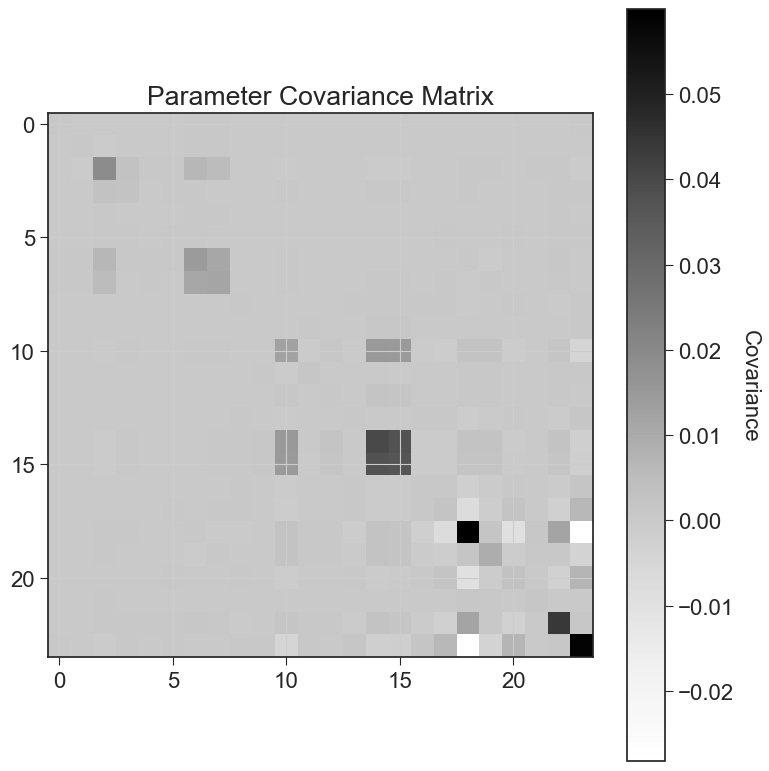

In [7]:
mean = _srcHC245 
# cov = cov_s245
fold_idx = (4, 6, 7, 4+Npar_src, 6+Npar_src, 7+Npar_src, 4+2*Npar_src, 6+2*Npar_src, 7+2*Npar_src)

cov = Proposals._empirical_cov(dat)
# print (cov)
fig, ax = plt.subplots(figsize=(8, 8))
im = ax.imshow(cov)
cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.set_ylabel("Covariance", rotation=-90, va="bottom")

ax.set_title("Parameter Covariance Matrix")
fig.tight_layout()
plt.show()


U, S = Proposals._eig_from_cov(cov)

T_prop, logqT = Proposals.make_student_t_proposal(jnp.asarray(cov), fold_idx=fold_idx, period=1.0)
Gaus_prop, logqG = Proposals.make_fullcov_proposal(jnp.asarray(cov), fold_idx=fold_idx, period=1.0)
SCAM_prop, logqS = Proposals.make_eigenline_proposal(U, S, fold_idx=fold_idx, period=1.0)
psn_prop, logqP = Proposals.make_pcn_proposal(mean, jnp.asarray(cov), fold_idx=fold_idx, period=1.0, beta=0.3)



In [8]:
key = jax.random.PRNGKey(42)

base_scale = 2.38/np.sqrt(dim)#*np.sqrt(Temperature) for tempered chains
print (dim, base_scale)

Gsampl =np.array(Gaus_prop(key, mean, 10_000, scale =base_scale))
Tsampl = np.array(T_prop(key, mean, 20_000, scale =3*base_scale))
SCAM_smpl = np.array(SCAM_prop(key, mean, 20_000, scale =3*base_scale))
psn_smpl = np.array(psn_prop(key, mean, 10_000, scale =base_scale))



24 0.485815465651997


In [9]:
import matplotlib.lines as mlines

# print ("proposed Gauss", Gsampl.shape, SCAM_smpl.shape  )
# # fig300 = corner.corner(Gsampl[:, :8], bins=50, hist_kwargs={'density':True, 'lw':3}, 
# fig300 = corner.corner(Tsampl[:, :8], bins=50, hist_kwargs={'density':True, 'lw':3}, 
# # fig300 = corner.corner(SCAM_smpl[:, :8], bins=50, hist_kwargs={'density':True, 'lw':3}, 
#                     plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
#                     show_titles=True, color='C2', use_math_test=True, truths=_srcHC245[:8]) 

# corner.corner(SCAM_smpl[:, :8], fig=fig300,bins=50, hist_kwargs={'density':True, 'lw':3},
#               plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
#               show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[:8])

# corner.corner(psn_smpl[:, :8], fig=fig300,bins=50, hist_kwargs={'density':True, 'lw':3},
#               plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
#               show_titles=True, color='C0', use_math_test=True, truths=_srcHC245[:8])

# line1 = mlines.Line2D([], [], color='C1', label='scam')
# line2 = mlines.Line2D([], [], color='C2', label='gauss')
# line3 = mlines.Line2D([], [], color='C0', label='psn')

# # # Add the legend to the figure
# fig300.legend(handles=[line1, line2, line3], loc='upper right', fontsize=20)


# # fig310 = corner.corner(Gsampl[:, 8:16], bins=50, hist_kwargs={'density':True, 'lw':3}, 
# fig310 = corner.corner(Tsampl[:, 8:16], bins=50, hist_kwargs={'density':True, 'lw':3}, 
#                     plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
#                     show_titles=True, color='C2', use_math_test=True, truths=_srcHC245[8:16]  ) 

# corner.corner(SCAM_smpl[:, 8:16], fig=fig310,bins=50, hist_kwargs={'density':True, 'lw':3},
#               plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
#               show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[8:16])

# corner.corner(psn_smpl[:, 8:16], fig=fig310,bins=50, hist_kwargs={'density':True, 'lw':3},
#               plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
#               show_titles=True, color='C0', use_math_test=True, truths=_srcHC245[8:16])


# # corner.corner(samples_Eryn_s24[:, 8:16], fig=fig310, bins=50, hist_kwargs={'density':True, 'lw':3},
# #               plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
# #               show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[8:16])

# fig320 = corner.corner(Gsampl[:, 16:24], bins=50, hist_kwargs={'density':True, 'lw':3}, 
#                     plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
#                     show_titles=True, color='C2', use_math_test=True, truths=_srcHC245[16:24]) 

# corner.corner(Tsampl[:, 16:24], fig=fig320,bins=50, hist_kwargs={'density':True, 'lw':3},
#               plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
#               show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[16:24])

# corner.corner(psn_smpl[:, 16:24], fig=fig320,bins=50, hist_kwargs={'density':True, 'lw':3},
#               plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
#               show_titles=True, color='C0', use_math_test=True, truths=_srcHC245[16:24])

 
# plt.show()

C=  4 | real=   0.42 ms | per eval =0.10444789950270206 
C=  8 | real=   0.64 ms | per eval =0.08003749971976504 
C= 12 | real=   0.75 ms | per eval =0.06245138356462121 
C= 16 | real=   1.00 ms | per eval =0.06254427498788573 
C= 24 | real=   1.02 ms | per eval =0.042677083304928 
C= 32 | real=   1.20 ms | per eval =0.037450262607308105 
C= 48 | real=   1.83 ms | per eval =0.0380633668100927 
C= 64 | real=   1.86 ms | per eval =0.029129428185115103 


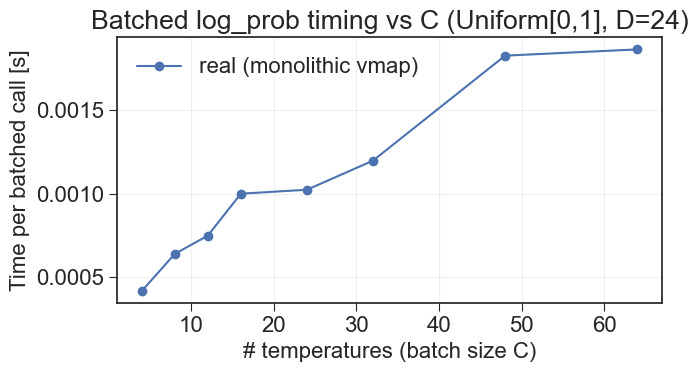

In [10]:
import time

def make_batched(fn):
    return jax.jit(jax.vmap(fn))

batched_real  = make_batched(GB3_loglik)

Cs = [4, 8, 12, 16, 24, 32, 48, 64]  # ladder sizes to test
warmup = 2
reps   = 5



def bench_one(batched_fn, C, key):
    # draw Uniform[0,1] parameters (C, D)
    key, sub = jax.random.split(key)
    x = jax.random.uniform(sub, shape=(C, dim), minval=0.0, maxval=1.0)
    # print (x.shape)
    # print (jax.vmap(GB3_loglik)(x))

    # warmup (compile + autotune)
    for _ in range(warmup):
        y = batched_fn(x)
        y.block_until_ready()

    # timed runs (vary inputs a bit so we don't re-hit caches identically)
    t0 = time.perf_counter()
    k = key
    for _ in range(reps):
        k, sub = jax.random.split(k)
        x = jax.random.uniform(sub, shape=(C, dim), minval=0.0, maxval=1.0)
        y = batched_fn(x)
        y.block_until_ready()  # IMPORTANT: sync with device
    t1 = time.perf_counter()
    return (t1 - t0) / reps

real_times = []
k = key
for C in Cs:
    tr  = bench_one(batched_real,  C, k)
    real_times.append(tr)
    print(f"C={C:>3d} | real={tr*1e3:7.2f} ms | per eval ={tr*1.e3/C} ")


plt.figure(figsize=(7,4))
plt.plot(Cs, real_times,        marker='o', label='real (monolithic vmap)')
plt.xlabel("# temperatures (batch size C)")
plt.ylabel("Time per batched call [s]")
plt.title("Batched log_prob timing vs C (Uniform[0,1], D=24)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


In [180]:
### Let's try to run....

key = jax.random.PRNGKey(42)

Num_temps = 30
Tmax = 10
Nsrc = 3
Npar_src = 8
dim = Nsrc * Npar_src

# cov = jnp.diag(jnp.full(dim, 0.01**2))
cov = last_cov

temps = my_mcmc.temperature_ladder(n_temps=Num_temps, T_min=1.0, T_max=Tmax, kind="geom", cold_dense=True, power=1.5)
print ('temperatures', temps)

initial_thetas = jnp.array([_srcHC245] * len(temps)) 
# baseweight = (0.2, 0.6, 0.2) ### t, scam, pcn
baseweight = (0.2, 0.4, 0.2) ### t, scam, pcn
weights = np.array([baseweight] * len(temps))


cfg = my_mcmc.AdaptConfig(
    m_epochs=600,       # number of adaptation epochs
    N_steps=500,      # number of steps per epoch
    # cov_mode = "all_states"
)





temperatures [1.        1.0148534 1.0425844 1.0796238 1.1251911 1.1792094 1.2419631
 1.3139853 1.3960142 1.4889795 1.594005  1.7124199 1.8457786 1.9958868
 2.164834  2.3550346 2.5692732 2.8107631 3.0832102 3.3908944 3.7387578
 4.132514  4.5787783 5.08521   5.6606936 6.315543  7.0617533 7.913274
 8.886365  9.999994 ]


In [181]:
from jax import lax

print(initial_thetas.shape)
print (jax.vmap(GB3_loglik)(initial_thetas))


def make_nonperiodic_mask(D: int, fold_idx=()):
    """mask[d]=True iff dim d is box-constrained (non-periodic)."""
    m = jnp.ones((D,), dtype=bool)
    if len(fold_idx):
        m = m.at[jnp.asarray(fold_idx, dtype=int)].set(False)
    return m

def make_boxed_logprob(log_prob_fn_single, *, low=0.0, high=1.0,
                       check_mask: jnp.ndarray | None = None):
    """
    Wrap (D,) -> () function with a [low,high] box prior on dims where check_mask==True.
    Returns a new (D,) -> () that yields -inf outside the box, and
    uses lax.cond so the heavy log_prob is NOT evaluated when invalid.
    """
    low = jnp.asarray(low); high = jnp.asarray(high)

    def _one(theta: jnp.ndarray):
        theta = jnp.asarray(theta)
        if check_mask is None:
            inside_all = jnp.all((theta >= low) & (theta <= high))
        else:
            # Only enforce on masked dims; others ignored (e.g., periodic)
            in_dim = (theta >= low) & (theta <= high)
            inside_all = jnp.all(jnp.where(check_mask, in_dim, True))

        def _do():   return log_prob_fn_single(theta)
        def _bad():  return jnp.array(-jnp.inf, dtype=theta.dtype)

        return lax.cond(inside_all, _do, _bad)

    return _one


check_mask = make_nonperiodic_mask(dim, fold_idx)           # True == enforce [0,1]
boxed_log_prob = make_boxed_logprob(GB3_loglik,           # your original fn
                                    low=0.0, high=1.0,
                                    check_mask=check_mask)

print (jax.vmap(boxed_log_prob)(initial_thetas))

(30, 24)
[-188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931]
[-188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931
 -188.01290931 -188.01290931 -188.01290931 -188.01290931 -188.01290931]


In [182]:
# final_state, run_info = my_mcmc.run_adaptive_pt(
final_state, run_info = my_mcmc.run_adaptive_pt_device_fast(
    key=key,
    initial_thetas=initial_thetas,
    temperatures=temps,
    log_prob_fn_single=boxed_log_prob,
    base_cov= cov,
    fold_idx = fold_idx,
    weights=weights,
    cfg=cfg
)

Adaptive PT (device):   2%|▏         | 10/600 [00:33<31:19,  3.19s/epoch]

Epoch 10/600 | swap_rate=0.425 | mean_acc=0.251


Adaptive PT (device):   3%|▎         | 20/600 [01:05<31:14,  3.23s/epoch]

Epoch 20/600 | swap_rate=0.419 | mean_acc=0.203


Adaptive PT (device):   5%|▌         | 30/600 [01:35<28:36,  3.01s/epoch]

Epoch 30/600 | swap_rate=0.415 | mean_acc=0.187


Adaptive PT (device):   7%|▋         | 40/600 [02:05<30:29,  3.27s/epoch]

Epoch 40/600 | swap_rate=0.419 | mean_acc=0.228


Adaptive PT (device):   8%|▊         | 50/600 [02:38<29:57,  3.27s/epoch]

Epoch 50/600 | swap_rate=0.416 | mean_acc=0.149


Adaptive PT (device):  10%|█         | 60/600 [03:14<27:35,  3.07s/epoch]

Epoch 60/600 | swap_rate=0.409 | mean_acc=0.147


Adaptive PT (device):  12%|█▏        | 70/600 [03:45<27:26,  3.11s/epoch]

Epoch 70/600 | swap_rate=0.408 | mean_acc=0.127


Adaptive PT (device):  13%|█▎        | 80/600 [04:14<24:58,  2.88s/epoch]

Epoch 80/600 | swap_rate=0.416 | mean_acc=0.135


Adaptive PT (device):  15%|█▌        | 90/600 [04:45<25:15,  2.97s/epoch]

Epoch 90/600 | swap_rate=0.414 | mean_acc=0.107


Adaptive PT (device):  17%|█▋        | 100/600 [05:18<29:27,  3.53s/epoch]

Epoch 100/600 | swap_rate=0.414 | mean_acc=0.122


Adaptive PT (device):  18%|█▊        | 110/600 [05:47<24:46,  3.03s/epoch]

Epoch 110/600 | swap_rate=0.411 | mean_acc=0.077


Adaptive PT (device):  20%|██        | 120/600 [06:19<25:59,  3.25s/epoch]

Epoch 120/600 | swap_rate=0.412 | mean_acc=0.111


Adaptive PT (device):  22%|██▏       | 130/600 [06:51<23:51,  3.04s/epoch]

Epoch 130/600 | swap_rate=0.410 | mean_acc=0.111


Adaptive PT (device):  23%|██▎       | 140/600 [07:22<24:41,  3.22s/epoch]

Epoch 140/600 | swap_rate=0.415 | mean_acc=0.120


Adaptive PT (device):  25%|██▌       | 150/600 [07:55<24:54,  3.32s/epoch]

Epoch 150/600 | swap_rate=0.407 | mean_acc=0.131


Adaptive PT (device):  27%|██▋       | 160/600 [08:29<25:33,  3.48s/epoch]

Epoch 160/600 | swap_rate=0.412 | mean_acc=0.124


Adaptive PT (device):  28%|██▊       | 170/600 [09:04<24:48,  3.46s/epoch]

Epoch 170/600 | swap_rate=0.408 | mean_acc=0.139


Adaptive PT (device):  30%|███       | 180/600 [09:41<23:26,  3.35s/epoch]

Epoch 180/600 | swap_rate=0.410 | mean_acc=0.082


Adaptive PT (device):  32%|███▏      | 190/600 [10:15<26:38,  3.90s/epoch]

Epoch 190/600 | swap_rate=0.417 | mean_acc=0.113


Adaptive PT (device):  33%|███▎      | 200/600 [10:47<21:59,  3.30s/epoch]

Epoch 200/600 | swap_rate=0.416 | mean_acc=0.102


Adaptive PT (device):  35%|███▌      | 210/600 [11:21<23:19,  3.59s/epoch]

Epoch 210/600 | swap_rate=0.412 | mean_acc=0.117


Adaptive PT (device):  37%|███▋      | 220/600 [11:54<21:10,  3.34s/epoch]

Epoch 220/600 | swap_rate=0.411 | mean_acc=0.069


Adaptive PT (device):  38%|███▊      | 230/600 [12:25<19:01,  3.09s/epoch]

Epoch 230/600 | swap_rate=0.407 | mean_acc=0.127


Adaptive PT (device):  40%|████      | 240/600 [12:57<20:05,  3.35s/epoch]

Epoch 240/600 | swap_rate=0.412 | mean_acc=0.077


Adaptive PT (device):  42%|████▏     | 250/600 [13:32<20:10,  3.46s/epoch]

Epoch 250/600 | swap_rate=0.409 | mean_acc=0.094


Adaptive PT (device):  43%|████▎     | 260/600 [14:05<19:15,  3.40s/epoch]

Epoch 260/600 | swap_rate=0.412 | mean_acc=0.059


Adaptive PT (device):  45%|████▌     | 270/600 [14:42<19:20,  3.52s/epoch]

Epoch 270/600 | swap_rate=0.406 | mean_acc=0.098


Adaptive PT (device):  47%|████▋     | 280/600 [15:17<19:41,  3.69s/epoch]

Epoch 280/600 | swap_rate=0.411 | mean_acc=0.104


Adaptive PT (device):  48%|████▊     | 290/600 [15:55<19:18,  3.74s/epoch]

Epoch 290/600 | swap_rate=0.409 | mean_acc=0.102


Adaptive PT (device):  50%|█████     | 300/600 [16:51<24:18,  4.86s/epoch]

Epoch 300/600 | swap_rate=0.412 | mean_acc=0.099


Adaptive PT (device):  52%|█████▏    | 310/600 [17:23<15:16,  3.16s/epoch]

Epoch 310/600 | swap_rate=0.414 | mean_acc=0.092


Adaptive PT (device):  53%|█████▎    | 320/600 [18:00<19:16,  4.13s/epoch]

Epoch 320/600 | swap_rate=0.408 | mean_acc=0.095


Adaptive PT (device):  55%|█████▌    | 330/600 [18:39<16:38,  3.70s/epoch]

Epoch 330/600 | swap_rate=0.414 | mean_acc=0.062


Adaptive PT (device):  57%|█████▋    | 340/600 [19:21<18:55,  4.37s/epoch]

Epoch 340/600 | swap_rate=0.403 | mean_acc=0.113


Adaptive PT (device):  58%|█████▊    | 350/600 [19:55<14:46,  3.55s/epoch]

Epoch 350/600 | swap_rate=0.409 | mean_acc=0.084


Adaptive PT (device):  60%|██████    | 360/600 [20:32<14:57,  3.74s/epoch]

Epoch 360/600 | swap_rate=0.404 | mean_acc=0.082


Adaptive PT (device):  62%|██████▏   | 370/600 [21:08<12:35,  3.28s/epoch]

Epoch 370/600 | swap_rate=0.410 | mean_acc=0.075


Adaptive PT (device):  63%|██████▎   | 380/600 [21:42<12:47,  3.49s/epoch]

Epoch 380/600 | swap_rate=0.414 | mean_acc=0.088


Adaptive PT (device):  65%|██████▌   | 390/600 [22:16<12:06,  3.46s/epoch]

Epoch 390/600 | swap_rate=0.416 | mean_acc=0.070


Adaptive PT (device):  67%|██████▋   | 400/600 [23:05<19:12,  5.76s/epoch]

Epoch 400/600 | swap_rate=0.415 | mean_acc=0.078


Adaptive PT (device):  68%|██████▊   | 410/600 [23:54<14:35,  4.61s/epoch]

Epoch 410/600 | swap_rate=0.414 | mean_acc=0.064


Adaptive PT (device):  70%|███████   | 420/600 [24:43<16:51,  5.62s/epoch]

Epoch 420/600 | swap_rate=0.422 | mean_acc=0.082


Adaptive PT (device):  72%|███████▏  | 430/600 [25:34<12:26,  4.39s/epoch]

Epoch 430/600 | swap_rate=0.413 | mean_acc=0.083


Adaptive PT (device):  73%|███████▎  | 440/600 [26:21<10:52,  4.08s/epoch]

Epoch 440/600 | swap_rate=0.420 | mean_acc=0.093


Adaptive PT (device):  75%|███████▌  | 450/600 [27:02<09:46,  3.91s/epoch]

Epoch 450/600 | swap_rate=0.408 | mean_acc=0.059


Adaptive PT (device):  77%|███████▋  | 460/600 [27:44<09:53,  4.24s/epoch]

Epoch 460/600 | swap_rate=0.411 | mean_acc=0.088


Adaptive PT (device):  78%|███████▊  | 470/600 [28:25<09:02,  4.17s/epoch]

Epoch 470/600 | swap_rate=0.409 | mean_acc=0.075


Adaptive PT (device):  80%|████████  | 480/600 [29:08<08:30,  4.25s/epoch]

Epoch 480/600 | swap_rate=0.417 | mean_acc=0.062


Adaptive PT (device):  82%|████████▏ | 490/600 [29:49<07:26,  4.06s/epoch]

Epoch 490/600 | swap_rate=0.415 | mean_acc=0.066


Adaptive PT (device):  83%|████████▎ | 500/600 [30:34<07:27,  4.48s/epoch]

Epoch 500/600 | swap_rate=0.408 | mean_acc=0.085


Adaptive PT (device):  85%|████████▌ | 510/600 [31:13<05:54,  3.94s/epoch]

Epoch 510/600 | swap_rate=0.425 | mean_acc=0.069


Adaptive PT (device):  87%|████████▋ | 520/600 [31:51<04:54,  3.69s/epoch]

Epoch 520/600 | swap_rate=0.411 | mean_acc=0.057


Adaptive PT (device):  88%|████████▊ | 530/600 [32:26<04:04,  3.49s/epoch]

Epoch 530/600 | swap_rate=0.421 | mean_acc=0.068


Adaptive PT (device):  90%|█████████ | 540/600 [33:05<03:53,  3.90s/epoch]

Epoch 540/600 | swap_rate=0.416 | mean_acc=0.078


Adaptive PT (device):  92%|█████████▏| 550/600 [33:45<03:15,  3.90s/epoch]

Epoch 550/600 | swap_rate=0.412 | mean_acc=0.081


Adaptive PT (device):  93%|█████████▎| 560/600 [34:23<02:33,  3.83s/epoch]

Epoch 560/600 | swap_rate=0.419 | mean_acc=0.066


Adaptive PT (device):  95%|█████████▌| 570/600 [35:05<02:03,  4.10s/epoch]

Epoch 570/600 | swap_rate=0.414 | mean_acc=0.098


Adaptive PT (device):  97%|█████████▋| 580/600 [35:49<01:16,  3.83s/epoch]

Epoch 580/600 | swap_rate=0.410 | mean_acc=0.057


Adaptive PT (device):  98%|█████████▊| 590/600 [36:28<00:39,  3.94s/epoch]

Epoch 590/600 | swap_rate=0.423 | mean_acc=0.052


Adaptive PT (device): 100%|██████████| 600/600 [37:06<00:00,  3.71s/epoch]


Epoch 600/600 | swap_rate=0.419 | mean_acc=0.065


In [183]:
# dbg = run_info["last_debug"]
# delta    = dbg["delta"]      # (T, C)
# loga     = dbg["log_alpha"]  # (T, C)
# u_log    = dbg["u_log"]      # (T, C)
# bad_acc  = dbg["bad_accept"] # (T, C)

# print("Debug Information:")
# print("Delta:", delta)
# print("Log Alpha:", loga)
# print("U Log:", u_log)
# print("Bad Acceptance:", bad_acc)
print (np.sqrt(0.5))

0.7071067811865476


In [184]:
# # 1) Flattened dataset
# ds = run_info["dataset"]
# X           = ds["X"]                  # (E*T*C, D)
# y_logprob   = ds["y_logprob"]          # (E*T*C,)
# accepted    = ds["accepted"].astype(bool)
# comp_idx    = ds["comp_idx"]
# chain_id    = ds["chain"]              # (E*T*C,)
# temperature = ds["temperature"]        # (E*T*C,)

# print(X.shape, y_logprob.shape, accepted.shape, chain_id.shape, temperature.shape, comp_idx.shape)

# # 2) End-of-epoch states
# chain = run_info["thetas_state"][:, 0, :]   # (E, D)
# logp  = run_info["logprob_state"][:, 0]     # (E,)
# print(chain.shape, logp.shape)

# # 3) Swap diagnostics (per edge)
# swap_raster = run_info["swap_decisions"]            # (E, T, C-1)
# C = run_info["thetas_state"].shape[1]
# acc_per_pair = swap_raster.reshape(-1, C-1).mean(axis=0)


# # 4) History (per epoch)
# scales_over_time        = run_info["scales_per_epoch"]        # (E, C)
# accept_rate_over_time   = run_info["accept_rate_per_epoch"]   # (E, C)
# swap_rate_over_time     = run_info["swap_rate_per_epoch"]     # (E,)
# covs_over_time          = run_info["covs_per_epoch"]          # (E, C, D, D)

temperature =  1.0
(39626, 24) (39626,)


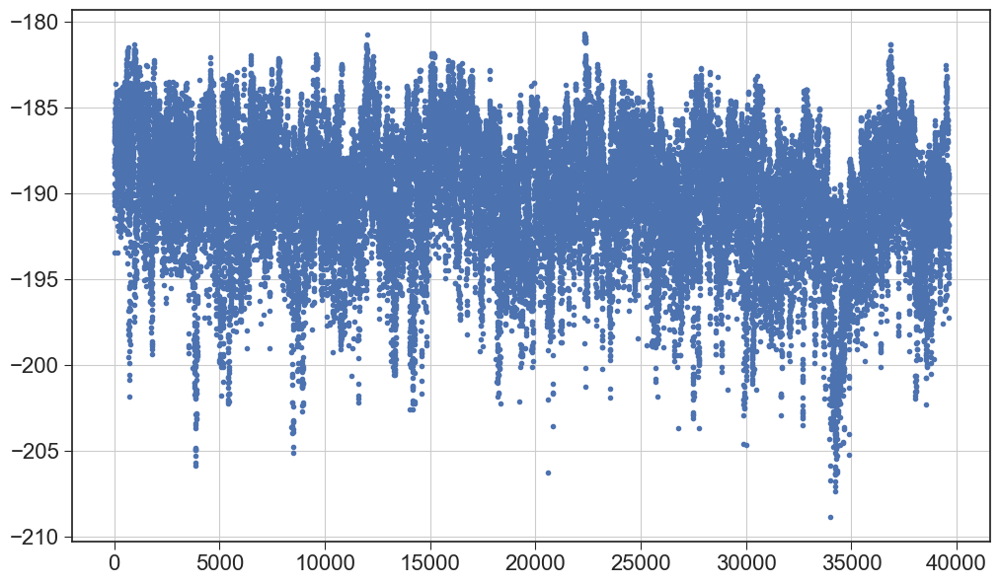

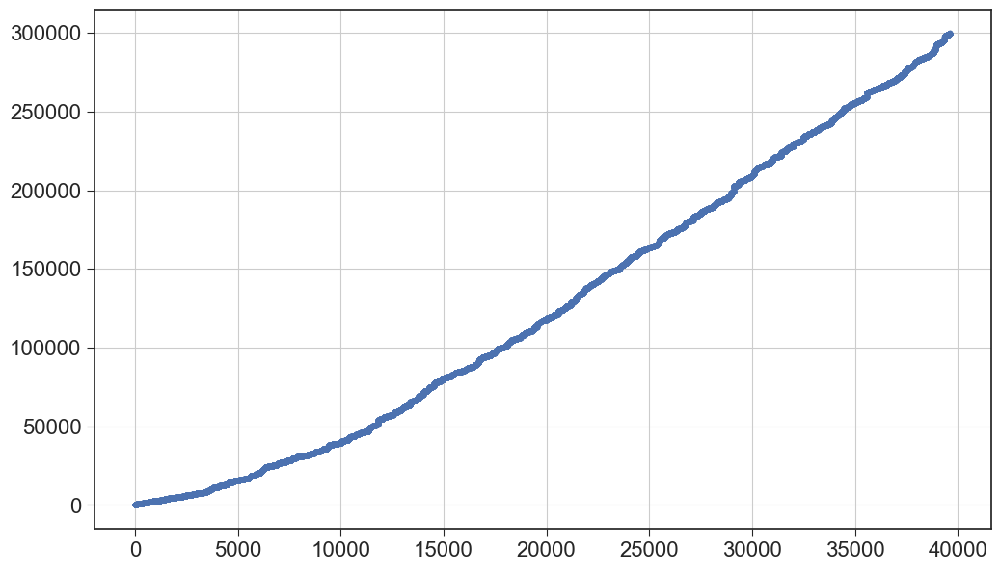

In [185]:
chain_id =0
print ('temperature = ', temps[chain_id])


def accepted_points_for_chain(run_info, chain_id: int):
    """
    Returns:
      X_acc  : (K, D) accepted proposals for chain_id
      y_acc  : (K,)   their true log_prob
      steps  : (K,)   global step indices 0..(E*T-1) where accept happened
    """
    tp  = np.asarray(run_info["thetas_prop"])   # (E,T,C,D) or (T,C,D)
    lp  = np.asarray(run_info["logprob_prop"])  # (E,T,C)   or (T,C)
    acc = np.asarray(run_info["accepted"])      # (E,T,C)   or (T,C)

    if tp.ndim == 4:
        E, T, C, D = tp.shape
        mask = acc[:, :, chain_id].reshape(E*T)              # (E*T,)
        X_acc = tp[:, :, chain_id, :].reshape(E*T, D)[mask]  # (K, D)
        y_acc = lp[:, :, chain_id].reshape(E*T)[mask]        # (K,)
        steps = np.flatnonzero(mask)                         # (K,)
        return X_acc, y_acc, steps

    elif tp.ndim == 3:
        T, C, D = tp.shape
        mask = acc[:, chain_id].astype(bool)                 # (T,)
        X_acc = tp[:, chain_id, :][mask]                     # (K, D)
        y_acc = lp[:, chain_id][mask]                        # (K,)
        steps = np.flatnonzero(mask)                         # (K,)
        return X_acc, y_acc, steps

    else:
        raise ValueError(f"Unexpected thetas_prop ndim={tp.ndim}")

# chain_id=0
chain_acc, ll_acc, _steps = accepted_points_for_chain(run_info, chain_id)

print (chain_acc.shape, ll_acc.shape)
plt.plot(ll_acc, '.', label='logprob')
plt.show()

plt.plot(_steps, '.')
plt.show()

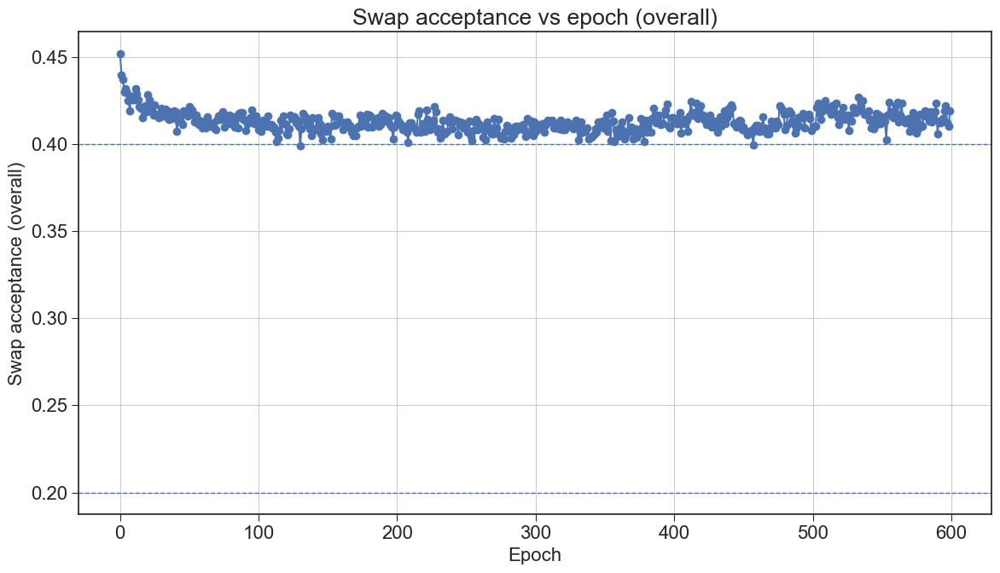

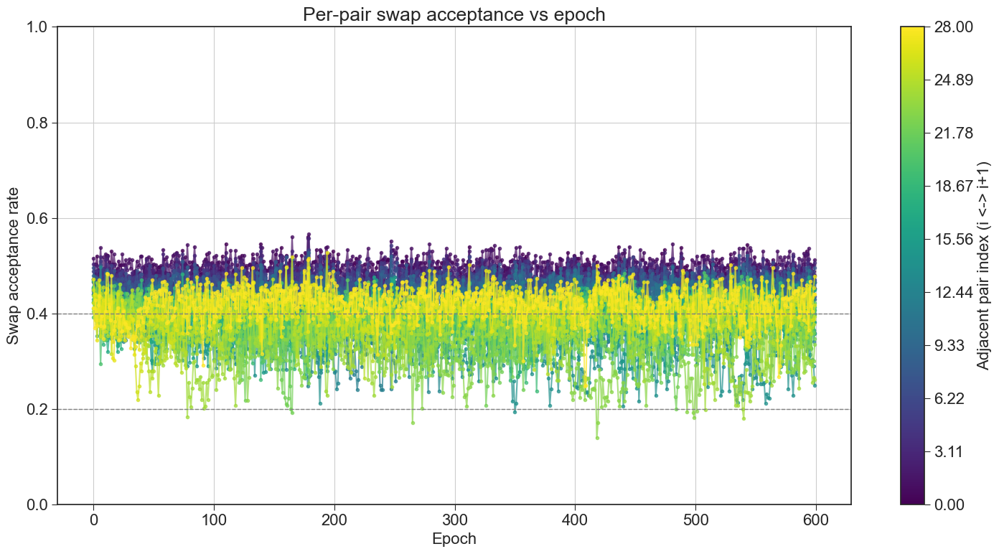

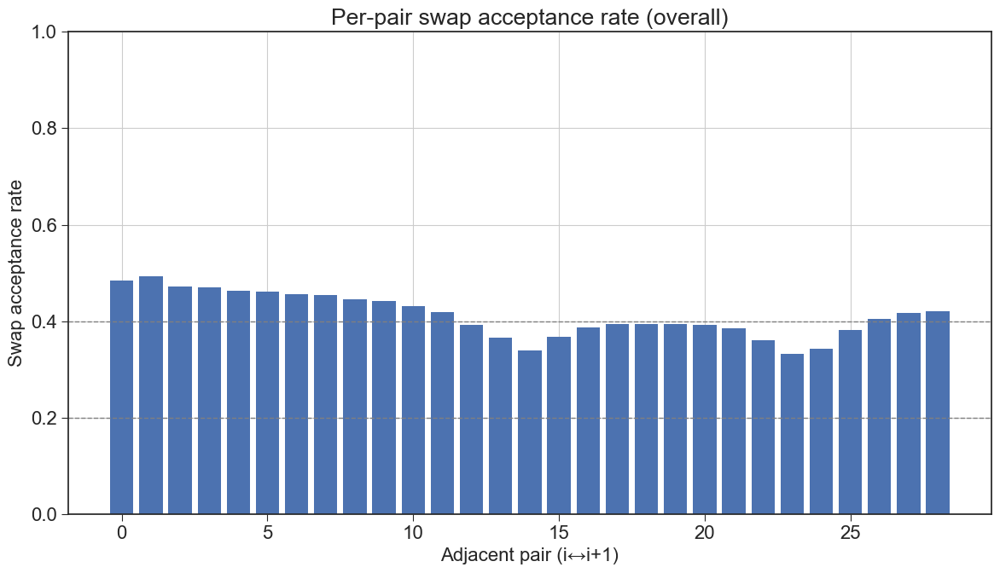

In [186]:

swap_raster = np.asarray(run_info["swap_decisions"])  # (E, T, C-1)
E, T, Cminus1 = swap_raster.shape

# 1) Overall swap acceptance vs epoch (averaged over steps and pairs)
acc_overall_vs_epoch = swap_raster.mean(axis=(1, 2))  # (E,)

plt.figure()
plt.plot(np.arange(E), acc_overall_vs_epoch, marker='o')
plt.axhline(0.2, ls="--", lw=1); plt.axhline(0.4, ls="--", lw=1)
plt.xlabel("Epoch"); plt.ylabel("Swap acceptance (overall)")
plt.title("Swap acceptance vs epoch (overall)")
plt.tight_layout()
plt.show()

# 2) Per-pair swap acceptance vs epoch (each line is an adjacent pair i↔i+1)
acc_per_pair_vs_epoch = swap_raster.mean(axis=1)       # (E, C-1)

# Use a colormap to generate colors based on the temperature of the colder chain in the pair
cmap = plt.get_cmap('viridis')
colors = cmap(np.linspace(0, 1, Cminus1))

fig, ax = plt.subplots(figsize=(15, 8))  # Get figure and axes objects
for p in range(Cminus1):
    ax.plot(np.arange(E), acc_per_pair_vs_epoch[:, p], marker='.', color=colors[p], alpha=0.7)

ax.axhline(0.2, ls="--", lw=1, color='grey'); ax.axhline(0.4, ls="--", lw=1, color='grey')
ax.set_xlabel("Epoch")
ax.set_ylabel("Swap acceptance rate")
ax.set_title("Per-pair swap acceptance vs epoch")
ax.set_ylim(0, 1.0)

# Create a colorbar to show the mapping from color to pair index
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=Cminus1-1))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, ticks=np.linspace(0, Cminus1-1, min(10, Cminus1))) # Specify the axes
cbar.set_label('Adjacent pair index (i <-> i+1)')

plt.tight_layout()
plt.show()



# swap_raster is a boolean array of shape (total_steps, C-1)
# In the even/odd swap scheme, each pair is only attempted on half the steps.
# To get the true acceptance rate (accepted / attempted), we must account for this.
# For a large number of steps, multiplying the mean by 2 is a good approximation.
# acc_per_pair_overall = swap_raster.mean(axis=(0, 1)) * 2.0
acc_per_pair_overall = swap_raster.mean(axis=(0, 1)) 

plt.figure()
plt.bar(np.arange(acc_per_pair_overall.size), acc_per_pair_overall)
plt.axhline(0.2, ls="--", lw=1, color='grey'); plt.axhline(0.4, ls="--", lw=1, color='grey')
plt.xlabel("Adjacent pair (i↔i+1)")
plt.ylabel("Swap acceptance rate")
plt.title("Per-pair swap acceptance rate (overall)")
plt.ylim(0, 1.0)  # Rates are between 0 and 1
plt.tight_layout()

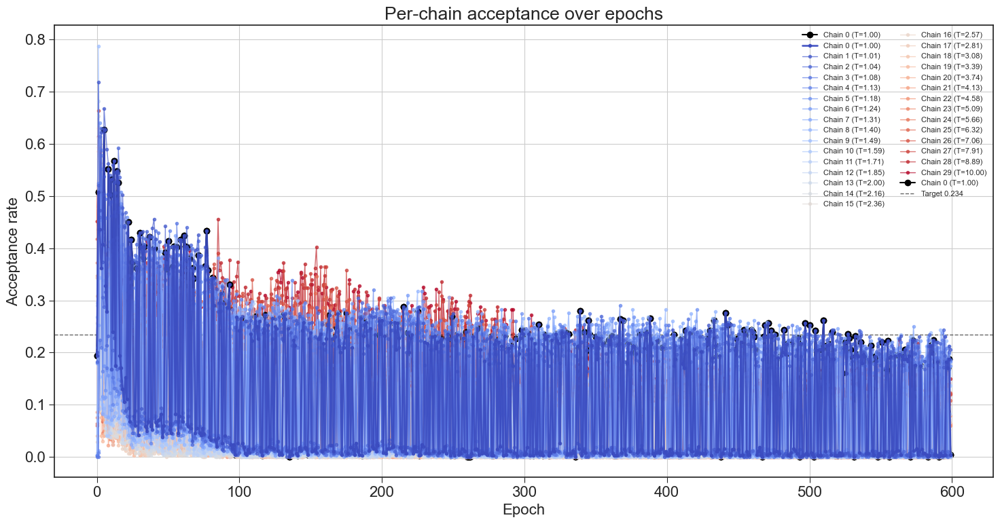

In [187]:
# acc_hist = np.asarray(run_info["accept_rate_per_epoch"])  # (E, C)
# E, C = acc_hist.shape

# plt.figure(figsize=(15,8))
# for c in range(C):
#     if (c == 0):
#         plt.plot(np.arange(E), acc_hist[:, c], marker='o', color='k', label=f"Chain {c} (T={run_info['temperatures'][0, c]:.2f})")
#     else:
#         plt.plot(np.arange(E), acc_hist[:, c], marker='.', label=f"Chain {c} (T={run_info['temperatures'][0, c]:.2f})", alpha=0.6)



# plt.axhline(0.234, ls="--", lw=1, color="k", alpha=0.6, label="Target 0.234")
# plt.xlabel("Epoch")
# plt.ylabel("Acceptance rate")
# plt.title("Per-chain acceptance over epochs")
# plt.legend(ncol=2, fontsize=8)
# plt.tight_layout()
# plt.show()


acc_hist = np.asarray(run_info["accept_rate_per_epoch"])  # (E, C)
E, C = acc_hist.shape
temps = run_info['temperatures'][0] # Get the temperatures array

# Use a colormap to generate colors based on temperature
cmap = plt.get_cmap("coolwarm")
colors = cmap(np.linspace(0, 1, C))

plt.figure(figsize=(15,8))
plt.plot(np.arange(E), acc_hist[:, 0], marker='o', color='k', label=f"Chain {c} (T={run_info['temperatures'][0, c]:.2f})")
for c in range(C):
    # The first chain (c=0) is the coldest, last chain is the hottest
    plt.plot(np.arange(E), acc_hist[:, c], marker='.', color=colors[c],
             label=f"Chain {c} (T={temps[c]:.2f})",
             # Make the cold chain more prominent
             zorder=C-c, lw=2 if c==0 else 1, alpha=0.9 if c==0 else 0.7)
    
c=0
plt.plot(np.arange(E), acc_hist[:, c], marker='o', color='k', label=f"Chain {c} (T={run_info['temperatures'][0, c]:.2f})")

plt.axhline(0.234, ls="--", lw=1, color="k", alpha=0.6, label="Target 0.234")
plt.xlabel("Epoch")
plt.ylabel("Acceptance rate")
plt.title("Per-chain acceptance over epochs")
plt.legend(ncol=2, fontsize=8)
plt.tight_layout()
plt.show()

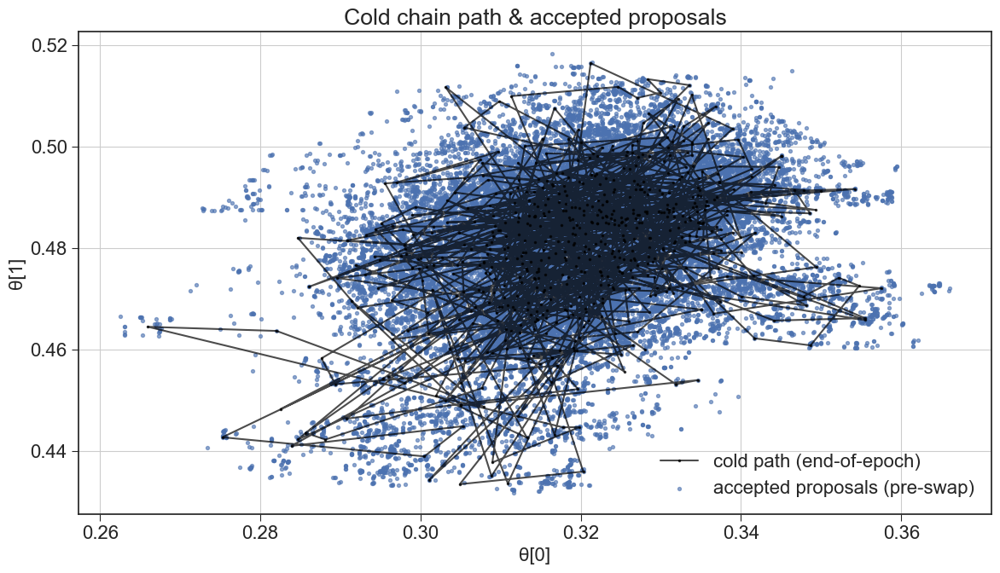

In [188]:
# End-of-epoch path (E, D) and logp (E,)
cold_path = np.asarray(run_info["thetas_state"])[:, chain_id, :]   # (E, D)
cold_logp = np.asarray(run_info["logprob_state"])[:, chain_id]     # (E,)

# Optional: visualize end-of-epoch log-prob
# plt.figure(); plt.plot(cold_logp, marker='.')
# plt.xlabel("Epoch"); plt.ylabel("log π"); plt.title("Cold chain log-prob (end-of-epoch)"); plt.tight_layout()

# Accepted proposals (pre-swap), flattened over epochs & steps
X_cold_acc, _, _ = accepted_points_for_chain(run_info, chain_id)   # (K, D)

# Overlay in 2D if possible
if cold_path.shape[1] >= 2 and X_cold_acc.size:
    plt.figure()
    plt.plot(cold_path[:, 0], cold_path[:, 1], "k.-", ms=3, alpha=0.7,
             label="cold path (end-of-epoch)")
    plt.scatter(X_cold_acc[:, 0], X_cold_acc[:, 1], s=8, alpha=0.6,
                label="accepted proposals (pre-swap)")
    plt.xlabel("θ[0]"); plt.ylabel("θ[1]")
    plt.title("Cold chain path & accepted proposals")
    plt.legend(); plt.tight_layout(); plt.show()

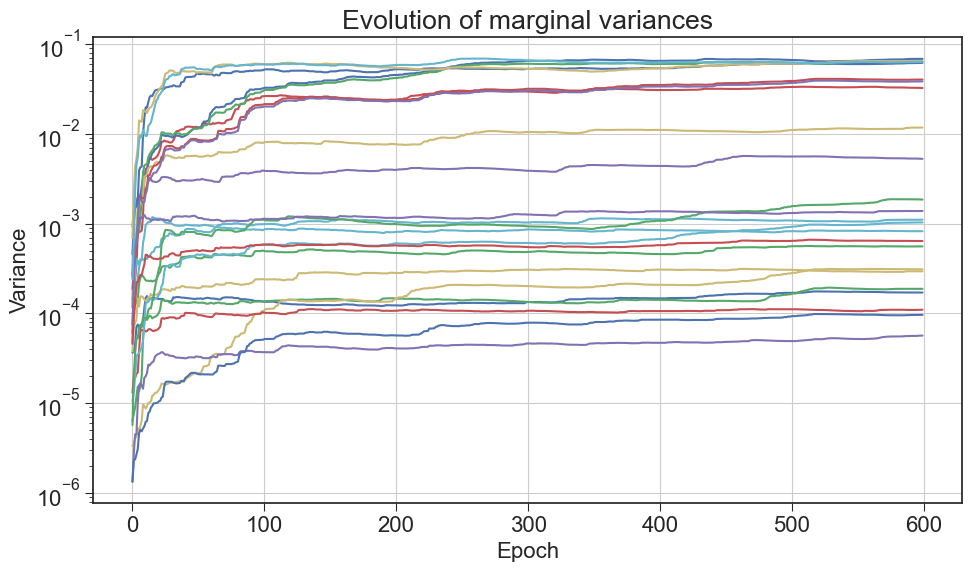

In [189]:
from IPython.display import display, clear_output
import time
import matplotlib.gridspec as gridspec
import seaborn as sns

# Ensure numpy array and chain_id defined
covs_over_time = np.asarray(run_info["covs_per_epoch"])  # (E, C, D, D)
chain_id = 0

print(covs_over_time[0].shape)  # (C, D, D)

# Variance evolution for a given chain
vars_evol = np.array([np.diag(C[chain_id, :, :]) for C in covs_over_time])  # (E, D)

# --- Animated correlation heatmap with fixed colorbar ---
fig = plt.figure(figsize=(7, 6))
gs = gridspec.GridSpec(1, 2, width_ratios=[20, 1], wspace=0.1)
ax = plt.subplot(gs[0])
cbar_ax = plt.subplot(gs[1])

E = covs_over_time.shape[0]
step = max(1, E // 20)                      # sample ~20 epochs
epochs_shown = np.arange(0, E, step)        # real epoch indices

for i, e in enumerate(epochs_shown):
    C = covs_over_time[e]                   # (C, D, D)
    ax.clear()

    # Correlation with epsilon guard
    S = np.diag(C[chain_id])                # (D,)
    denom = np.sqrt(np.outer(S, S)) + 1e-12
    corr = C[chain_id] / denom

    is_first = (i == 0)
    sns.heatmap(corr, vmin=-1, vmax=1, cmap="coolwarm",
                ax=ax, cbar=is_first, cbar_ax=cbar_ax if is_first else None)
    ax.set_title(f"Correlation matrix at epoch {e}")

    display(fig)
    clear_output(wait=True)
    time.sleep(0.3)  # was 1s; adjust as you like

plt.close(fig)

# Variance traces
plt.figure(figsize=(10, 6))
for d in range(vars_evol.shape[1]):
    plt.semilogy(vars_evol[:, d], label=f"param {d}")
plt.xlabel("Epoch"); plt.ylabel("Variance")
plt.title("Evolution of marginal variances")
# plt.legend()
plt.tight_layout()
plt.show()

last_cov = covs_over_time[-1][chain_id]  # (D, D)

In [190]:
start =0

def autocorr_1d(x, max_lag=None):
    """
    Compute autocorrelation function of a 1D series using FFT.
    Returns acf[0..max_lag].
    """
    x = np.asarray(x)
    x = x - np.mean(x)
    n = len(x)
    if max_lag is None:
        max_lag = n - 1

    # FFT-based autocorrelation
    f = np.fft.fft(x, n=2*n)
    acf = np.fft.ifft(f * np.conjugate(f))[:n].real
    acf /= acf[0]  # normalize
    return acf[:max_lag+1]

def integrated_autocorr_time(x, max_lag=None, c=5.0):
    """
    Compute the integrated autocorrelation time (IAT) for a 1D series.
    Parameters:
      x        : array (n,)
      max_lag  : maximum lag to consider
      c        : cutoff factor, stop summing when lag > c * tau
    Returns:
      tau_int  : integrated autocorrelation time
    """
    acf = autocorr_1d(x, max_lag)
    tau = 1.0
    for t in range(1, len(acf)):
        if acf[t] <= 0:   # conservative cutoff
            break
        tau += 2.0 * acf[t]
        if t > c * tau:   # automatic windowing
            break
    return tau



for ii in range (dim):
    acf =  integrated_autocorr_time(chain_acc[start:, ii])
    print (ii, acf)

0 363.9884870311337
1 1202.6141855534258
2 2520.5660478690747
3 486.8629072306734
4 3772.3979450566776
5 140.39011572138082
6 1254.986893078837
7 1342.3492701529126
8 333.193890619203
9 1173.532275364665
10 1198.6968437196854
11 357.90413105710894
12 1617.7174226027585
13 788.3266531705139
14 228.7835877734327
15 891.1619749959949
16 228.585725746493
17 678.6706043900303
18 340.3183560397184
19 1869.6797535696894
20 375.53292527830536
21 208.21140945074004
22 484.81926957941744
23 695.547859613811


In [178]:
ery_samples = np.load('chains/samples_Eryn_s245_Compar.npy')[::20, :]
print (ery_samples.shape, chain_acc.shape)

(72000, 24) (38504, 24)


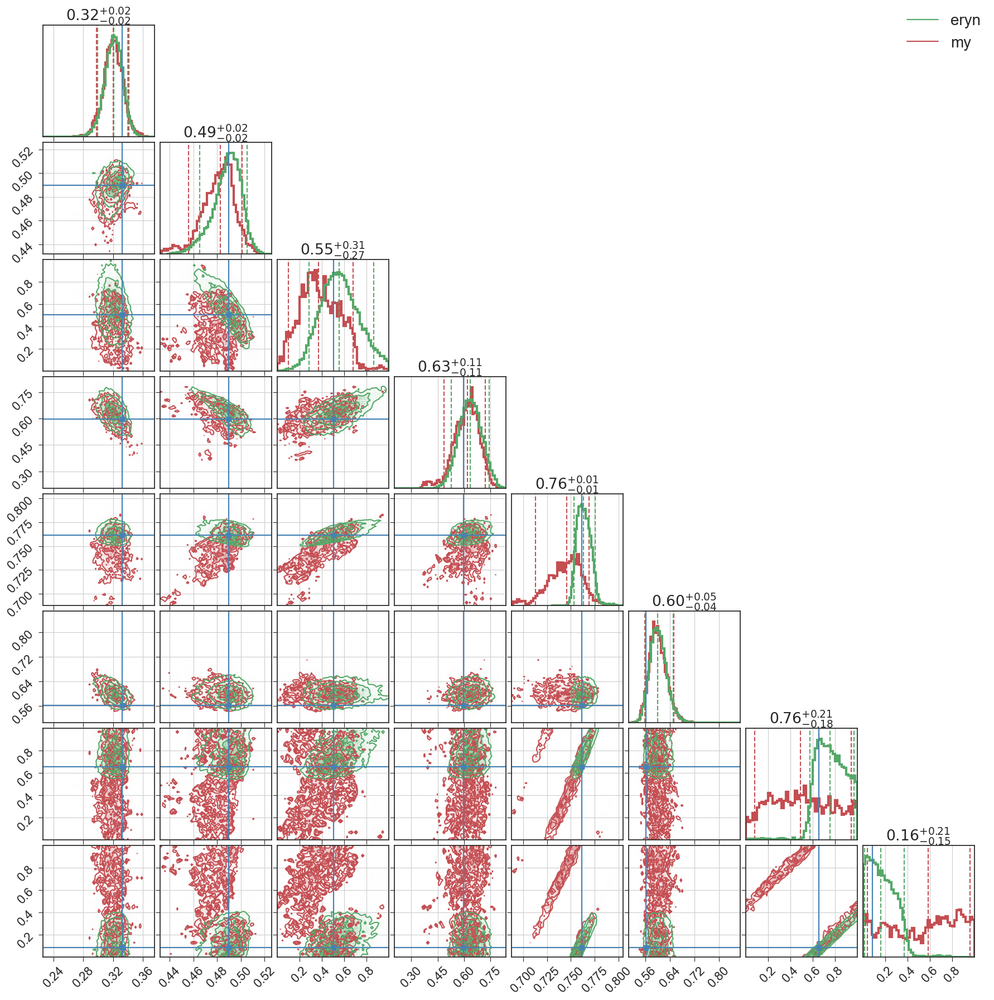

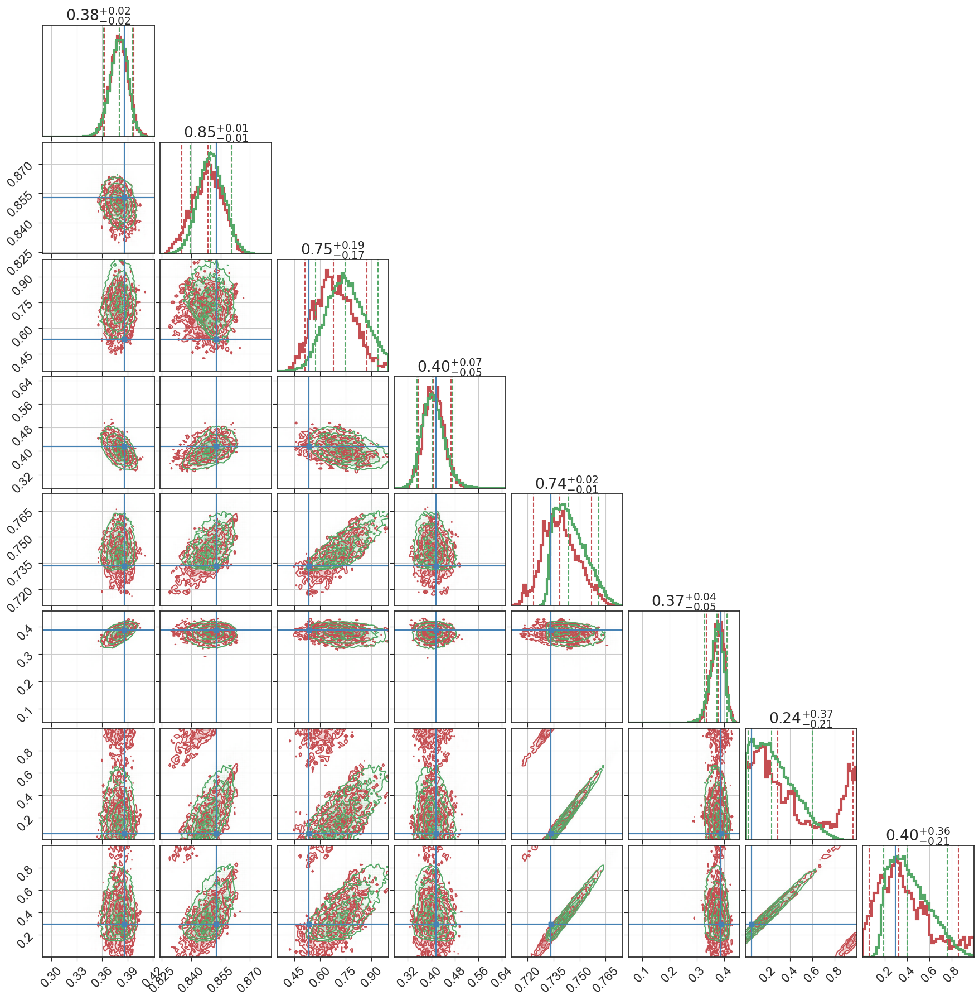

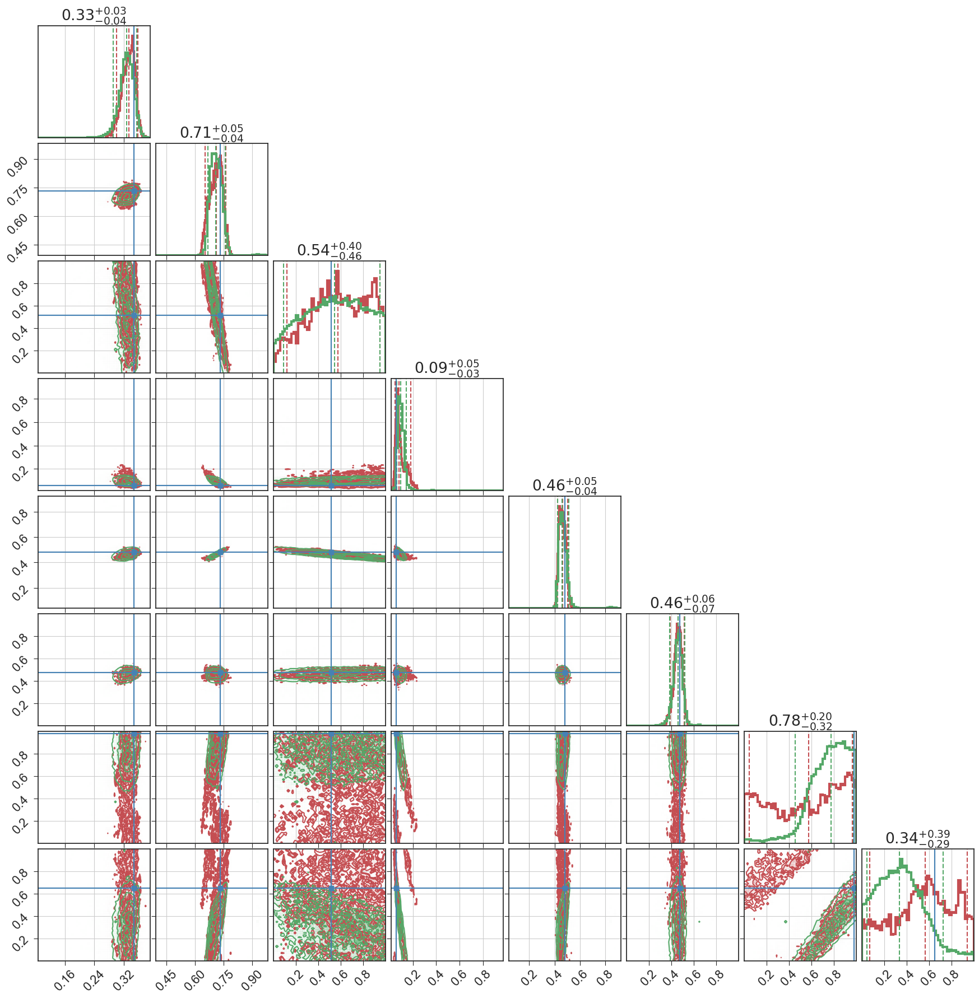

In [191]:
import matplotlib.lines as mlines

start = 5_000
fig300 = corner.corner(chain_acc[start:, :8], bins=50, hist_kwargs={'density':True, 'lw':3}, 
                    plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
                    show_titles=True, color='C2', use_math_test=True, truths=_srcHC245[:8]) 

corner.corner(ery_samples[:, :8], fig=fig300,bins=50, hist_kwargs={'density':True, 'lw':3},
              plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
              show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[:8])

line1 = mlines.Line2D([], [], color='C1', label='eryn')
line2 = mlines.Line2D([], [], color='C2', label='my')

# Add the legend to the figure
fig300.legend(handles=[line1, line2], loc='upper right', fontsize=20)


fig310 = corner.corner(chain_acc[start:, 8:16], bins=50, hist_kwargs={'density':True, 'lw':3}, 
                    plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
                    show_titles=True, color='C2', use_math_test=True, truths=_srcHC245[8:16]  ) 


corner.corner(ery_samples[:, 8:16], fig=fig310, bins=50, hist_kwargs={'density':True, 'lw':3},
              plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
              show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[8:16])

fig320 = corner.corner(chain_acc[start:, 16:24], bins=50, hist_kwargs={'density':True, 'lw':3}, 
                    plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
                    show_titles=True, color='C2', use_math_test=True, truths=_srcHC245[16:24]) 

corner.corner(ery_samples[:, 16:24], fig=fig320, bins=50, hist_kwargs={'density':True, 'lw':3},
              plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
              show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[16:24])

 
plt.show()

In [ ]:
### save points for training

ds = run_info["dataset"]   # built by InfoAccumulator.pack()

X          = np.asarray(ds["X"])            # (N, D)  all proposals across epochs × chains
y_logprob  = np.asarray(ds["y_logprob"])    # (N,)    log π(θ) for each proposal
accepted   = np.asarray(ds["accepted"]).astype(bool)   # (N,)   was it accepted?
chain_id   = np.asarray(ds["chain"])        # (N,)    temperature slot index (0=cold)
temperature= np.asarray(ds["temperature"])  # (N,)    absolute T for that slot
comp_idx   = np.asarray(ds["comp_idx"])     # (N,)    proposal component (0=t,1=eigline,2=pcn)

# Basic cleaning: drop invalid likelihoods (outside box -> -inf) and NaNs
mask = np.isfinite(y_logprob)
X_clean, y_logprob_clean = X[mask], y_logprob[mask]
accepted, chain_id, temperature, comp_idx = (
    accepted[mask], chain_id[mask], temperature[mask], comp_idx[mask]
)

print("NN dataset:", X_clean.shape, y_logprob_clean.shape)

# Hash to 4 decimals to collapse duplicates
X_round = np.round(X_clean, 4)
_, uniq_idx = np.unique(X_round, axis=0, return_index=True)
X_clean, y_logprob_clean = X[uniq_idx], y_logprob[uniq_idx]
accepted = accepted[uniq_idx]; chain_id = chain_id[uniq_idx]
temperature = temperature[uniq_idx]; comp_idx = comp_idx[uniq_idx]

print("NN dataset:", X_clean.shape, y_logprob_clean.shape)







NN dataset: (7742540, 24) (7742540,)
NN dataset: (7737335, 24) (7737335,)


In [196]:
print(accepted.shape, chain_id.shape, temperature.shape, comp_idx.shape)
print (accepted[:10], chain_id[:10], temperature[:10], comp_idx[:10])

(7737335,) (7737335,) (7737335,) (7737335,)
[False False False False  True False False False  True  True] [29 13 15 24 26 16 19 28 27 27] [9.999994  1.9958868 2.3550346 5.6606936 7.0617533 2.5692732 3.3908944
 8.886365  7.913274  7.913274 ] [1 1 1 1 1 1 1 1 1 0]


In [197]:
np.savez_compressed(
    "ptdmh_train_data.npz",
    X=X_clean, y_raw=y_logprob_clean,
    accepted=accepted, chain_id=chain_id,
    temperature=temperature, comp_idx=comp_idx
)

In [199]:
### create subset:

import numpy as np

def build_surrogate_subset(run_info,
                           target_N=500_000,
                           topK=50_000,
                           n_bins=24,
                           dedup_decimals=3,
                           seed=0):
    """
    Returns: dict with X, y_center, y_raw, T, chain, comp, accepted, weights
    Strategy:
      - filter finite
      - de-dup rows of X by rounding to `dedup_decimals`
      - keep topK y
      - stratify sample equally across (temperature slot) x (y-quantile bin)
    """

    ds = run_info["dataset"]         # from InfoAccumulator
    X   = np.asarray(ds["X"])        # (N, D)
    y   = np.asarray(ds["y_logprob"])# (N,)
    T   = np.asarray(ds["temperature"])
    ch  = np.asarray(ds["chain"])
    acc = np.asarray(ds["accepted"]).astype(bool)
    comp= np.asarray(ds["comp_idx"])

    # 0) filter finite
    mask = np.isfinite(y)
    X, y, T, ch, acc, comp = X[mask], y[mask], T[mask], ch[mask], acc[mask], comp[mask]

    # 1) approximate de-dup by rounding (cheap & effective)
    if dedup_decimals is not None:
        Xr = np.round(X, dedup_decimals)
        # fast unique by viewing rows as bytes
        view = np.ascontiguousarray(Xr).view(
            np.dtype((np.void, Xr.dtype.itemsize * Xr.shape[1]))
        )
        _, uniq_idx = np.unique(view, return_index=True)
        uniq_idx.sort()
        X, y, T, ch, acc, comp = X[uniq_idx], y[uniq_idx], T[uniq_idx], ch[uniq_idx], acc[uniq_idx], comp[uniq_idx]

    N, D = X.shape
    rng = np.random.default_rng(seed)

    # 2) always keep topK best points (clipped to available)
    K = min(topK, N)
    top_idx = np.argpartition(y, -K)[-K:]
    keep = set(top_idx.tolist())

    # 3) stratify by (temperature slot) × (y-quantile bin)
    temps = np.unique(ch)  # temperature slot ids (0=cold)
    # global quantile edges over remaining points
    # (global bins are simpler and work well)
    edges = np.quantile(y, np.linspace(0, 1, n_bins + 1))

    # per-cell budget
    remaining = max(0, target_N - len(keep))
    per_temp = max(1, remaining // len(temps))
    per_cell = max(1, per_temp // n_bins)

    # build indices per temp/bin (excluding already kept topK)
    pool_idx = np.setdiff1d(np.arange(N, dtype=int), np.fromiter(keep, int))
    for t in temps:
        I_t = pool_idx[ch[pool_idx] == t]
        if I_t.size == 0:
            continue
        y_t = y[I_t]
        # digitize to bins 0..n_bins-1 (rightmost included in last bin)
        b = np.clip(np.digitize(y_t, edges[1:-1]), 0, n_bins - 1)
        for bin_id in range(n_bins):
            I_cell = I_t[b == bin_id]
            if I_cell.size == 0: 
                continue
            take = min(per_cell, I_cell.size)
            keep.update(rng.choice(I_cell, size=take, replace=False).tolist())

    keep = np.fromiter(keep, dtype=int)
    # If still short, fill uniformly from leftovers
    if keep.size < target_N:
        leftover = np.setdiff1d(np.arange(N, dtype=int), keep)
        extra = min(target_N - keep.size, leftover.size)
        if extra > 0:
            keep = np.concatenate([keep, rng.choice(leftover, size=extra, replace=False)])

    # 4) final subset + normalization
    keep.sort()
    X_sub   = X[keep].astype(np.float32, copy=False)
    y_sub   = y[keep].astype(np.float32, copy=False)
    T_sub   = T[keep].astype(np.float32, copy=False)
    ch_sub  = ch[keep].astype(np.int32,   copy=False)
    acc_sub = acc[keep]
    comp_sub= comp[keep].astype(np.int32, copy=False)

    # center y for numerics (≤ 0)
    y_center = y_sub - np.max(y_sub)

    # 5) simple sample weights: inverse frequency of (temp, bin)
    b_sub = np.clip(np.digitize(y_sub, edges[1:-1]), 0, n_bins - 1)
    key = np.stack([ch_sub, b_sub], axis=1)
    # count per (temp,bin)
    uniq, counts = np.unique(key, axis=0, return_counts=True)
    # map back
    # make a dictionary from (temp,bin)->count
    from collections import defaultdict
    cnt = defaultdict(lambda: 1)
    for (t,b), c in zip(map(tuple, uniq), counts):
        cnt[(t,b)] = c
    weights = np.array([1.0 / cnt[(int(t), int(b))] for t, b in zip(ch_sub, b_sub)], dtype=np.float32)
    # normalize weights
    weights *= (weights.size / weights.sum()).astype(np.float32)

    out = dict(
        X=X_sub, y_center=y_center, y_raw=y_sub,
        temperature=T_sub, chain=ch_sub, accepted=acc_sub, comp=comp_sub,
        weights=weights, quantile_edges=edges.astype(np.float32)
    )
    return out

# Example usage:
subset = build_surrogate_subset(run_info,
                                target_N=500_000,
                                topK=75_000,
                                n_bins=24,
                                dedup_decimals=3,
                                seed=123)

np.savez_compressed("ptdmh_surrogate_subset.npz", **subset)
print({k: v.shape for k, v in subset.items() if hasattr(v, "shape")})




{'X': (500000, 24), 'y_center': (500000,), 'y_raw': (500000,), 'temperature': (500000,), 'chain': (500000,), 'accepted': (500000,), 'comp': (500000,), 'weights': (500000,), 'quantile_edges': (25,)}


In [200]:
## Testing the NN predictive logP

In [233]:
import TrainLogLik as NN
import pickle
predict, meta, params = NN.load_surrogate("trained_loglik_modelv3.pkl")

In [234]:
print (GB3_loglik(_srcHC245), predict(_srcHC245))

print (ery_samples[:, :].shape)

-188.01290930804637 -186.50197
(72000, 24)


In [235]:
from tqdm import tqdm

true_ll = []
pred_ll = []
for ii, p in tqdm(enumerate(ery_samples[:, :])):
    true_ll.append(GB3_loglik(p))
    pred_ll.append(predict(p))

true_ll = np.array(true_ll)
pred_ll = np.array(pred_ll) 

72000it [00:28, 2497.19it/s]


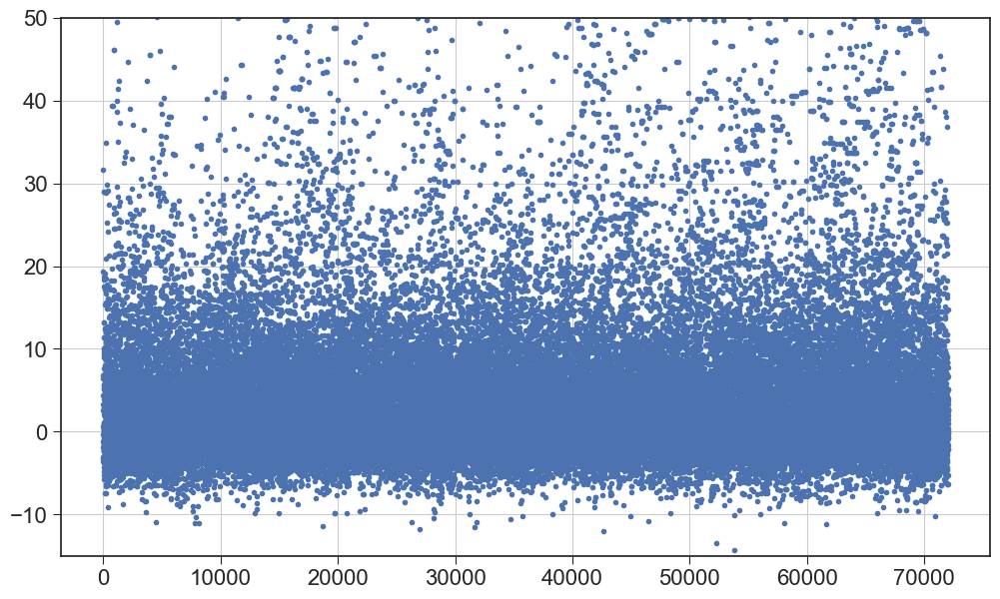

(72000,)
(61644, 1) (69905, 1) (45369, 1) (26631, 1)


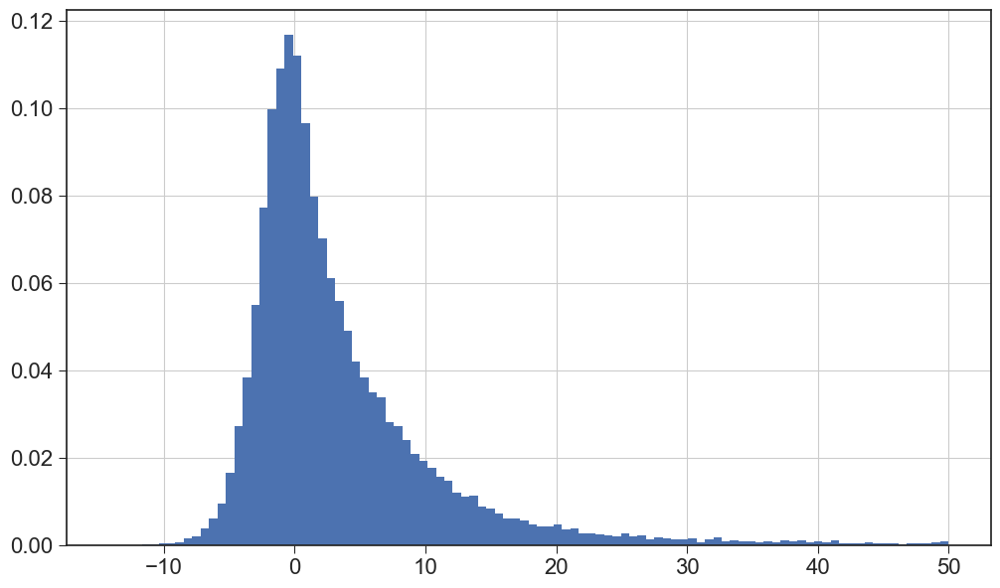

In [238]:
plt.plot(true_ll - pred_ll, '.')
plt.ylim(-15, 50)
plt.show()

# pred_ll = pred_ll - 180.47157

diff_ll = true_ll - pred_ll

print (true_ll.shape)
print (np.argwhere(diff_ll < 10).shape, np.argwhere(diff_ll < 30).shape, np.argwhere(diff_ll > 0).shape, np.argwhere(diff_ll < 0).shape )

plt.hist(diff_ll[np.argwhere(diff_ll < 50)], bins=100, density=True)
plt.show()

In [10]:

Num_temps = 12
Tmax = 10

temps = my_mcmc.temperature_ladder(n_temps=Num_temps, T_min=1.0, T_max=Tmax, kind="geom", cold_dense=False, power=2.0)

print (temps)

# [ 1.         1.3949507  1.9458876  2.7144175  3.7864785  5.281951
#   7.3680615 10.278083  14.3374195 19.999994 ]

covs = []
base_scales = []
eig_U = []
eig_S = []
means_for_indep = []

baseweight = (0.1, 0.8, 0.4)
weights = np.array([baseweight] * len(temps))
print (weights.shape)
for T in temps:
    base_scales.append(base_scale * np.sqrt(T))
    covs.append(cov * T)
    eig_U.append(U)
    eig_S.append(S)
    means_for_indep.append(mean)


[ 1.         1.2328467  1.519911   1.8738174  2.3101296  2.8480358
  3.5111916  4.328761   5.336699   6.5793324  8.111308  10.       ]
(12, 3)


In [11]:
def check_symmetry(rng_key, x, n=5):
    key_prop, key = jax.random.split(rng_key)
    xs = SCAM_prop(key_prop, x, n, scale=1.0)   # proposals from eigen-line kernel
    fwd = logqS(xs, x[None, :], scale=1.0)
    rev = logqS(jnp.repeat(x[None,:], n, axis=0), xs, scale=1.0)
    return xs, fwd, rev, jnp.max(jnp.abs(fwd - rev))

print (check_symmetry(key, mean, 3))

(Array([[0.3326565 , 0.4898174 , 0.50842919, 0.59503001, 0.7613683 ,
        0.56083067, 0.65540521, 0.08676386, 0.38616559, 0.85282209,
        0.53585385, 0.41571259, 0.73355088, 0.38827728, 0.05548447,
        0.29474858, 0.3477061 , 0.7330136 , 0.51520895, 0.05699891,
        0.48268667, 0.47491808, 0.98187837, 0.64900797],
       [0.33265666, 0.48990919, 0.50843411, 0.59503607, 0.76136396,
        0.56083061, 0.65540499, 0.08676054, 0.38616514, 0.85278538,
        0.53585467, 0.41571281, 0.73340854, 0.38827813, 0.05549029,
        0.29474993, 0.3477073 , 0.73301494, 0.51520896, 0.0569989 ,
        0.48268569, 0.47491817, 0.98187838, 0.64900794],
       [0.3323035 , 0.48967786, 0.50926937, 0.59615538, 0.76135978,
        0.55988563, 0.65702506, 0.08637166, 0.38375916, 0.85397577,
        0.58320898, 0.41585146, 0.73760055, 0.38249972, 0.14235086,
        0.37700497, 0.33788011, 0.70220313, 0.69804642, 0.0752595 ,
        0.44671598, 0.47674653, 0.03423551, 0.48043116]], dtype=float

In [12]:
# all_props, all_logq, all_weights = Proposals.build_general_mixture_components_per_chain(
#     covs, eig_U, eig_S, means_for_indep,  # lists/arrays per chain
#     temps, base_scales,             # arrays length n_chains
#     fold_idx=fold_idx, period=1.0,
#     use_pcn=True, beta=0.3,               # switch between independence and pCN
#     kappa_line=3.0,                        # eigen-line larger factor
#     weights=weights                          # (n_chains, 3)
# )

In [13]:
initial_thetas = jnp.array([mean] * len(temps))  # (n_chains, dim)

print (dim)

24


In [14]:
### Let's try to run....
cov = jnp.diag(jnp.full(dim, 0.01**2))
# cov = last_cov
Num_temps = 20
Tmax = 30

temps = my_mcmc.temperature_ladder(n_temps=Num_temps, T_min=1.0, T_max=Tmax, kind="geom", cold_dense=True, power=2.0)
initial_thetas = jnp.array([_srcHC245] * len(temps)) 
baseweight = (0.3, 0.5, 0.5) ### t, scam, pcn
weights = np.array([baseweight] * len(temps))


print (initial_thetas.shape, temps.shape, cov.shape)

print (temps)

state, run_info = my_mcmc.run_adaptive_mcmc_per_chain_mixture(
    key,
    initial_thetas, temps,
    GB3_loglik,
    cov,
    fold_idx=fold_idx,  # if needed
    period=1.0,
    m_epochs=100, ### Number of iterations /updates of covariance
    N_steps=300,
    target_accept=0.234,
    scale_init=1.0,
    kappa_line=3.0,
    beta_base=0.3,
    beta_temp_scale=True,
    init_weights=weights
)


(20, 24) (20,) (24, 24)
[ 1.         1.0094662  1.0384055  1.0884932  1.1627008  1.265592
  1.4037925  1.586703   1.827561   2.145021   2.5655165  3.1268096
  3.8833954  4.914795   6.3384423  8.329967  11.15546   15.223517
 21.170261  29.999977 ]


PT-MCMC warmup: 100%|██████████| 100/100 [43:27<00:00, 26.08s/epoch]


In [15]:
import pickle

# Assuming 'run_info' is the dictionary you want to save
# The 'wb' means 'write bytes', which is required for pickle
# with open('run_info_data.pkl', 'wb') as f:
#     pickle.dump(run_info, f)


# with open('run_info_data.pkl', 'rb') as f:
#     loaded_run_info = pickle.load(f)

# # Now you can use the loaded dictionary just like the original one
# print("Loaded keys:", loaded_run_info.keys())

In [ ]:
# with open('run_info_data.pkl', 'rb') as f:
#     run_info = pickle.load(f)

In [40]:
ds = run_info["dataset"]
X          = ds["X"]            # (N, dim)
y_logprob  = ds["y_logprob"]    # (N,)
accepted   = ds["accepted"].astype(bool)
chain_id   = ds["chain"]
temperature= ds["temperature"]
comp_idx   = ds["comp_idx"]

print (X.shape, y_logprob.shape, accepted.shape, chain_id.shape, temperature.shape, comp_idx.shape)

chain_id = 0
chain= run_info["thetas_state"][:, chain_id, :]   # (ΣT, dim)
logp = run_info["logprob_state"][:, chain_id]     # (ΣT,)

print (chain.shape, logp.shape)

# 3) Swap diagnostics
swap_raster  = run_info["swap_decisions"]       # (ΣT, C-1) bool
acc_per_pair = swap_raster.mean(axis=0)         # (C-1,)
replica_ids  = run_info.get("replica_id", None) # (ΣT, C) if you added it


# 4) History (per epoch)
hist = run_info["history"]
scales_over_time   = hist["scale"]        # list of (C,)
weights_over_time  = hist["weights"]      # list of (C,K)
swap_rate_over_time= hist["swap_rate"]    # list of float
accept_rate_over_time = hist["accept_rate"]  # list of (C,)
covs_over_time = hist["covs_per_epoch"]                # list of (C, D, D)

(720012, 24) (720012,) (720012,) (720012,) (720012,) (720012,)
(60001, 24) (60001,)


(18655, 24) (18655,)


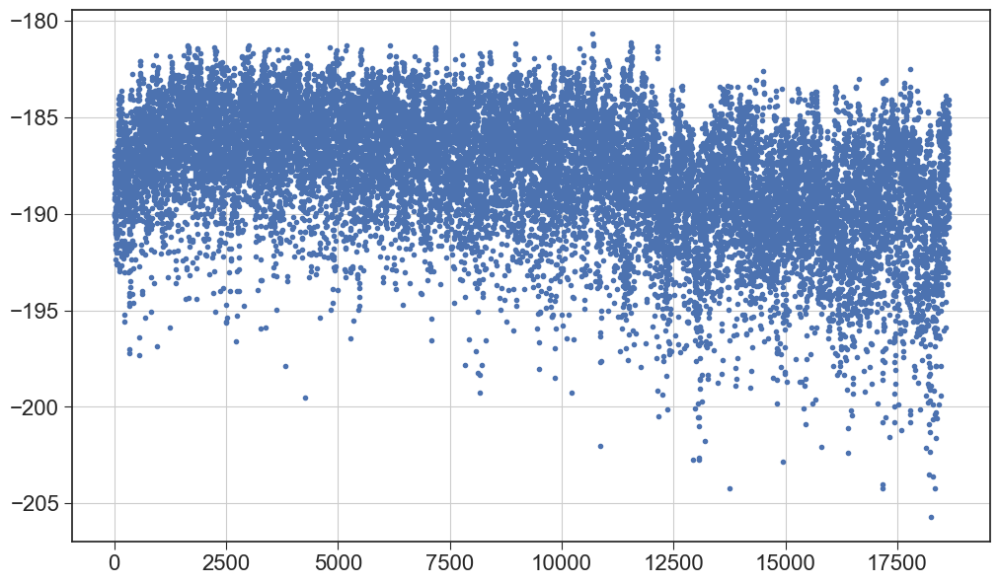

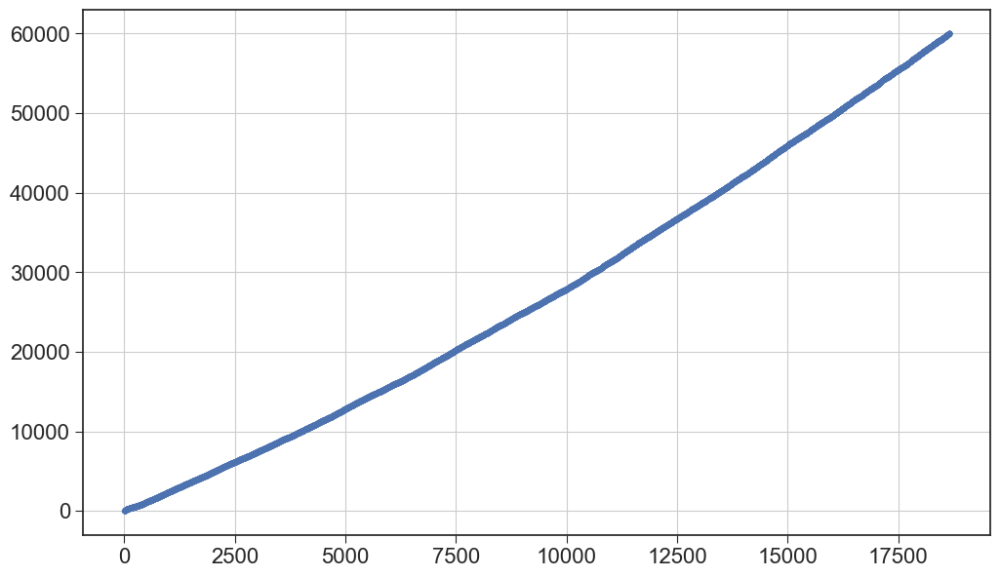

In [41]:
def accepted_points_for_chain(run_info, chain_id: int):
    """
    Returns:
      X_acc  : (K, dim) accepted proposals for chain_id
      y_acc  : (K,)     their true log_prob
      steps  : (K,)     global step indices (0..ΣT-1) where accept happened
    """
    thetas_prop  = np.asarray(run_info["thetas_prop"])    # (ΣT, C, D)
    logprob_prop = np.asarray(run_info["logprob_prop"])   # (ΣT, C)
    accepted     = np.asarray(run_info["accepted"])       # (ΣT, C)

    mask = accepted[:, chain_id].astype(bool)             # (ΣT,)
    X_acc = thetas_prop[mask, chain_id, :]                # (K, D)
    y_acc = logprob_prop[mask, chain_id]                  # (K,)
    steps = np.nonzero(mask)[0]                           # (K,)
    return X_acc, y_acc, steps

# chain_id=0
chain_acc, ll_acc, _steps = accepted_points_for_chain(run_info, chain_id)

print (chain_acc.shape, ll_acc.shape)
plt.plot(ll_acc, '.', label='logprob')
plt.show()

plt.plot(_steps, '.')
plt.show()

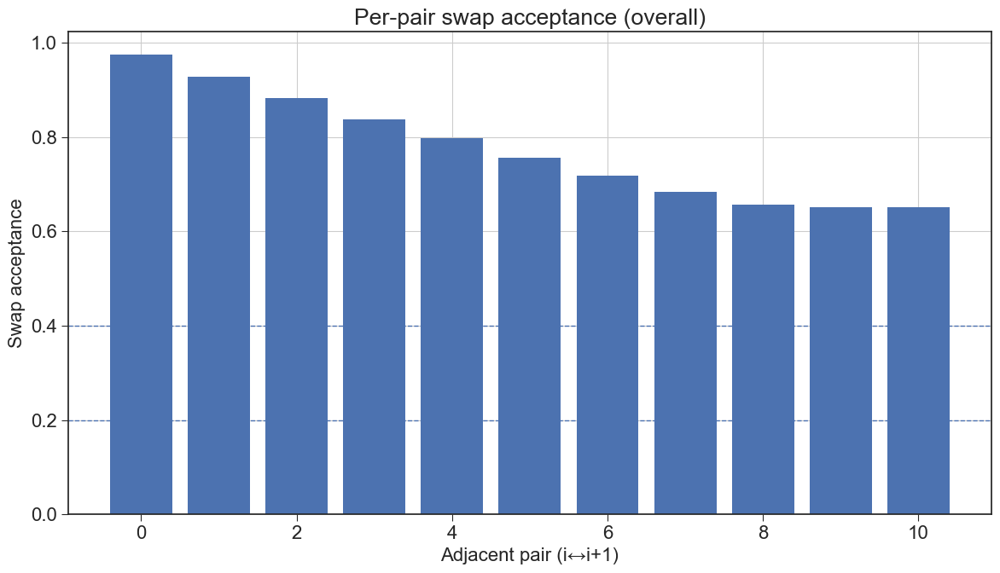

In [42]:
swap_raster = np.asarray(run_info["swap_decisions"])  # (ΣT, C-1) bool
acc_per_pair_overall = swap_raster.mean(axis=0)       # (C-1,)
plt.figure()
plt.bar(np.arange(acc_per_pair_overall.size), acc_per_pair_overall)
plt.axhline(0.2, ls="--", lw=1); plt.axhline(0.4, ls="--", lw=1)
plt.xlabel("Adjacent pair (i↔i+1)"); plt.ylabel("Swap acceptance")
plt.title("Per-pair swap acceptance (overall)")
plt.tight_layout()



No replica ids


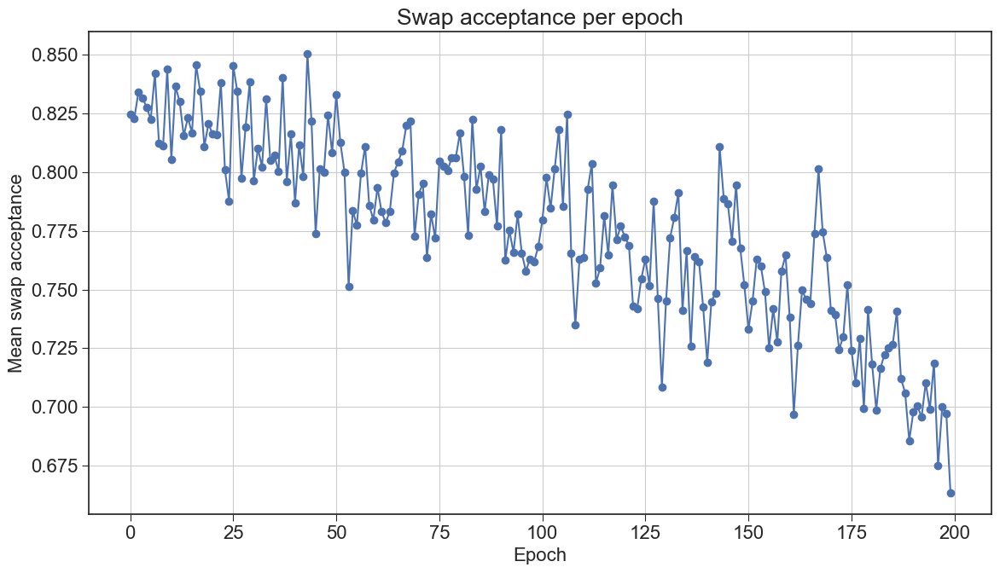

In [43]:
swap_rate_per_epoch = np.asarray(run_info["history"]["swap_rate"])  # (E,)
plt.figure(); plt.plot(swap_rate_per_epoch, marker="o")
plt.xlabel("Epoch"); plt.ylabel("Mean swap acceptance"); plt.title("Swap acceptance per epoch"); plt.tight_layout()

rep_ids = run_info.get("replica_id", None)  # (ΣT, C)
print (rep_ids.shape if rep_ids is not None else "No replica ids")
if rep_ids is not None:
    pos_rep0 = rep_ids.argmax(axis=1)       # ladder index of replica 0 over time
    plt.figure(); plt.plot(pos_rep0); plt.xlabel("Step"); plt.ylabel("Temp index"); plt.title("Replica 0 ladder position"); plt.tight_layout()

    def count_round_trips(pos, cold=0, hot=None):
        if hot is None: hot = int(pos.max())
        phase, trips = 0, 0
        for p in pos:
            if phase == 0 and p == hot: phase = 1
            elif phase == 1 and p == cold: trips += 1; phase = 0
        return trips
    print("Replica 0 round-trips:", count_round_trips(pos_rep0, cold=0))

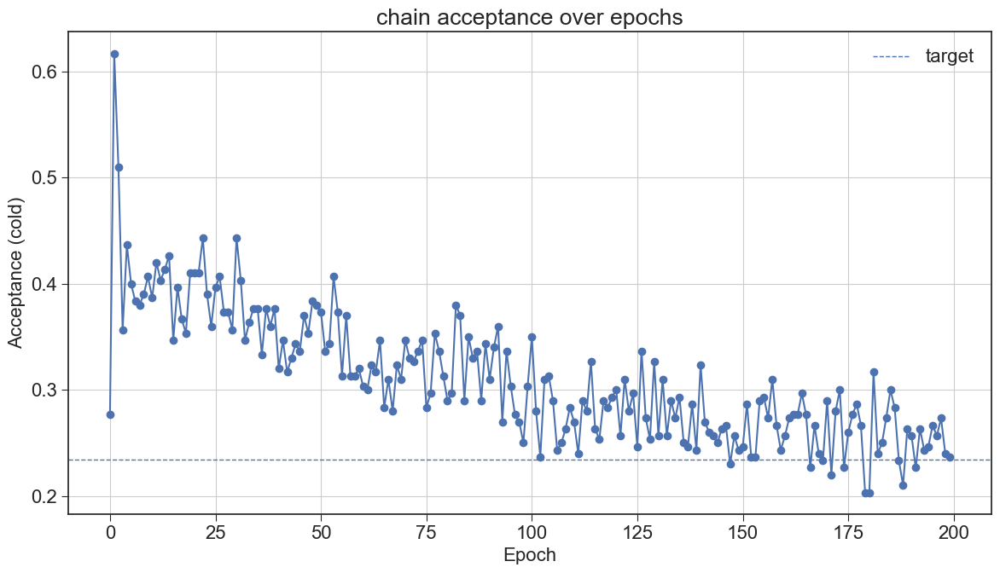

In [44]:
acc_hist = np.asarray(run_info["history"]["accept_rate"])  # (E, C)
acc_cold = acc_hist[:, chain_id]                                  # (E,)
plt.figure(); plt.plot(acc_cold, marker="o")
plt.xlabel("Epoch"); plt.ylabel("Acceptance (cold)"); plt.title("chain acceptance over epochs")
plt.axhline(0.234, ls="--", lw=1, label="target"); plt.legend(); plt.tight_layout()

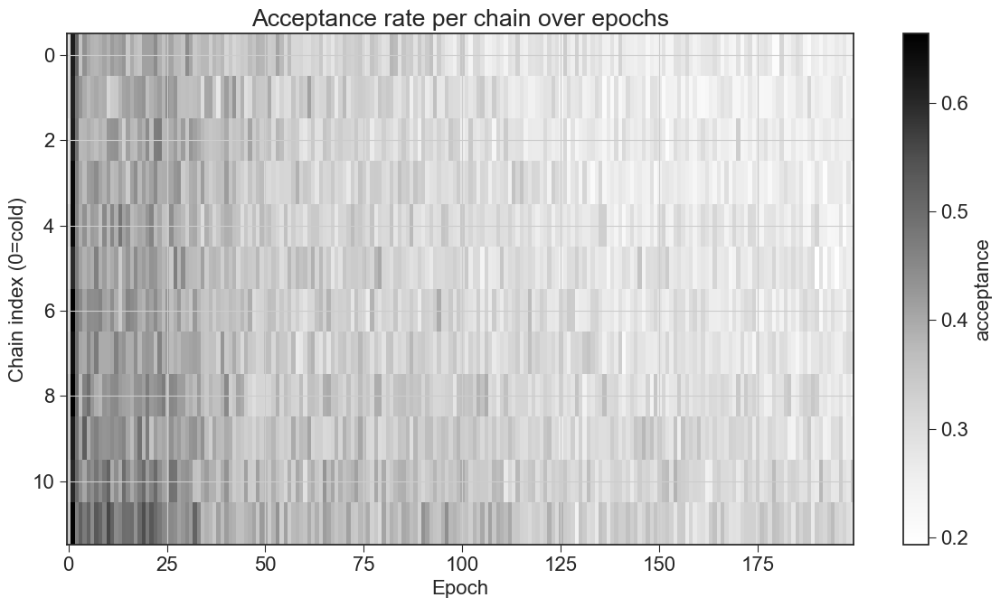

In [45]:
plt.figure()
plt.imshow(acc_hist.T, aspect="auto", interpolation="nearest")
plt.colorbar(label="acceptance")
plt.xlabel("Epoch"); plt.ylabel("Chain index (0=cold)")
plt.title("Acceptance rate per chain over epochs"); plt.tight_layout()

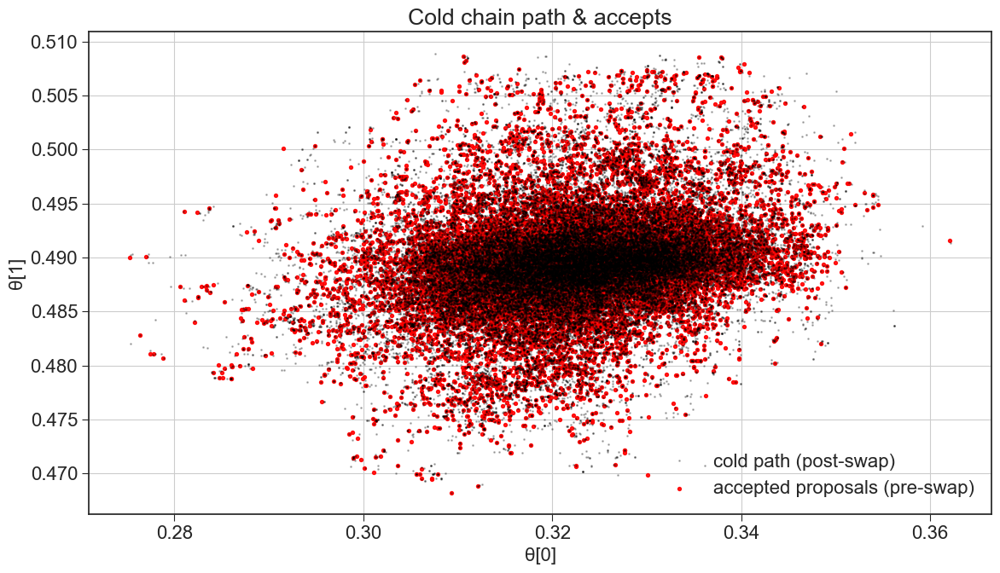

In [46]:
cold_path  = np.asarray(run_info["thetas_state"])[:, chain_id, :]   # (ΣT, D)
cold_logp  = np.asarray(run_info["logprob_state"])[:, chain_id]

# plt.figure(); plt.plot(cold_logp); plt.xlabel("Step"); plt.ylabel("log π"); plt.title("Cold chain log-prob"); plt.tight_layout()

# Overlay accepted proposals (pre-swap) in 2D if D>=2
X_cold_acc, _, _ = accepted_points_for_chain(run_info, 0)
if cold_path.shape[1] >= 2 and X_cold_acc.size:
    plt.figure()
    plt.plot(cold_path[:,0], cold_path[:,1], "k.", ms=2, alpha=0.25, label="cold path (post-swap)")
    plt.scatter(X_cold_acc[:,0], X_cold_acc[:,1], c='r', s=8, alpha=0.9, label="accepted proposals (pre-swap)")
    plt.xlabel("θ[0]"); plt.ylabel("θ[1]"); plt.title("Cold chain path & accepts"); plt.legend(); plt.tight_layout()


In [47]:
ery_samples = np.load('chains/samples_Eryn_s245_Compar.npy')[::20, :]
print (ery_samples.shape, chain_acc.shape)

(72000, 24) (18655, 24)


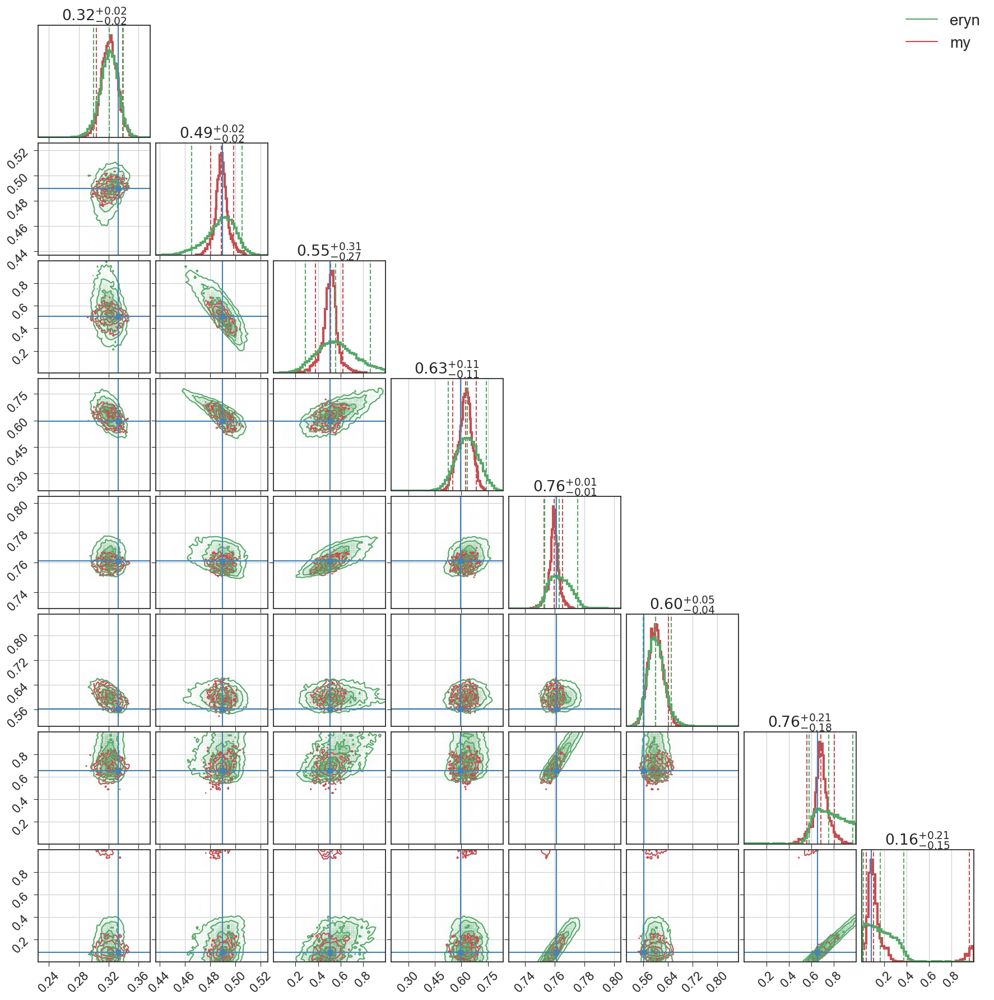

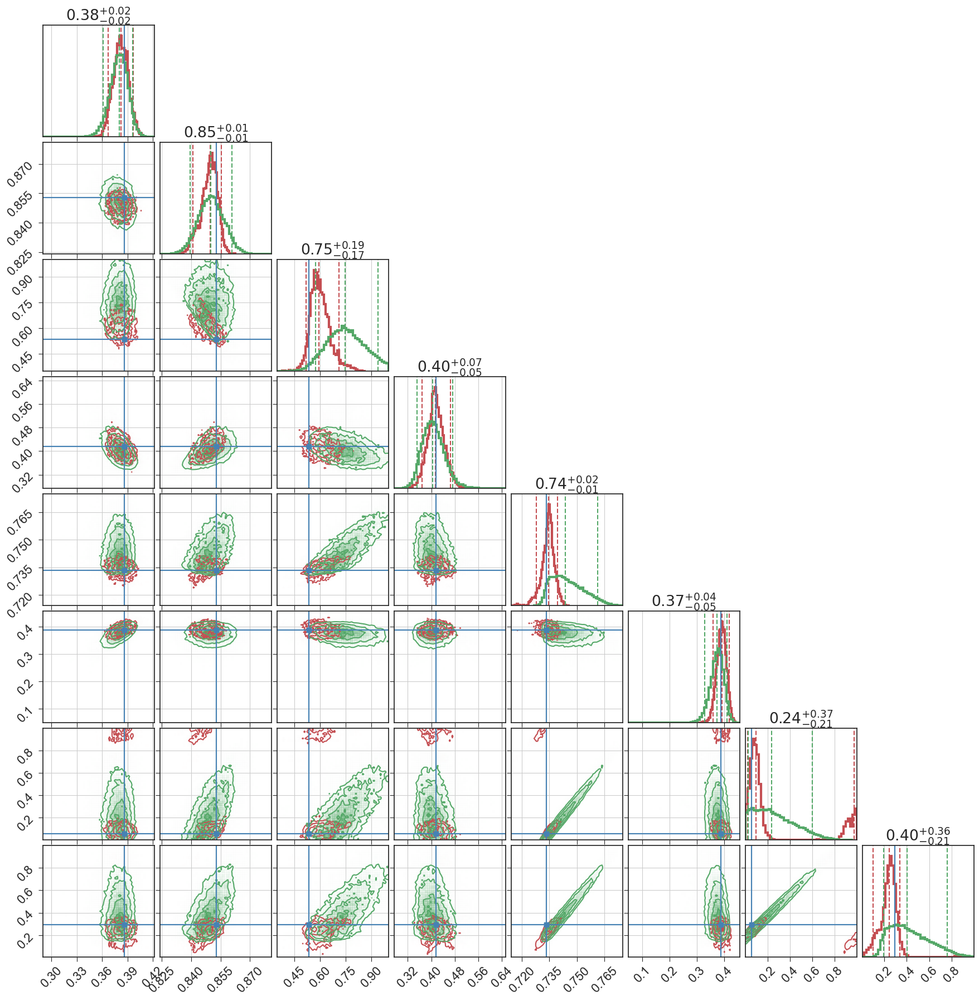

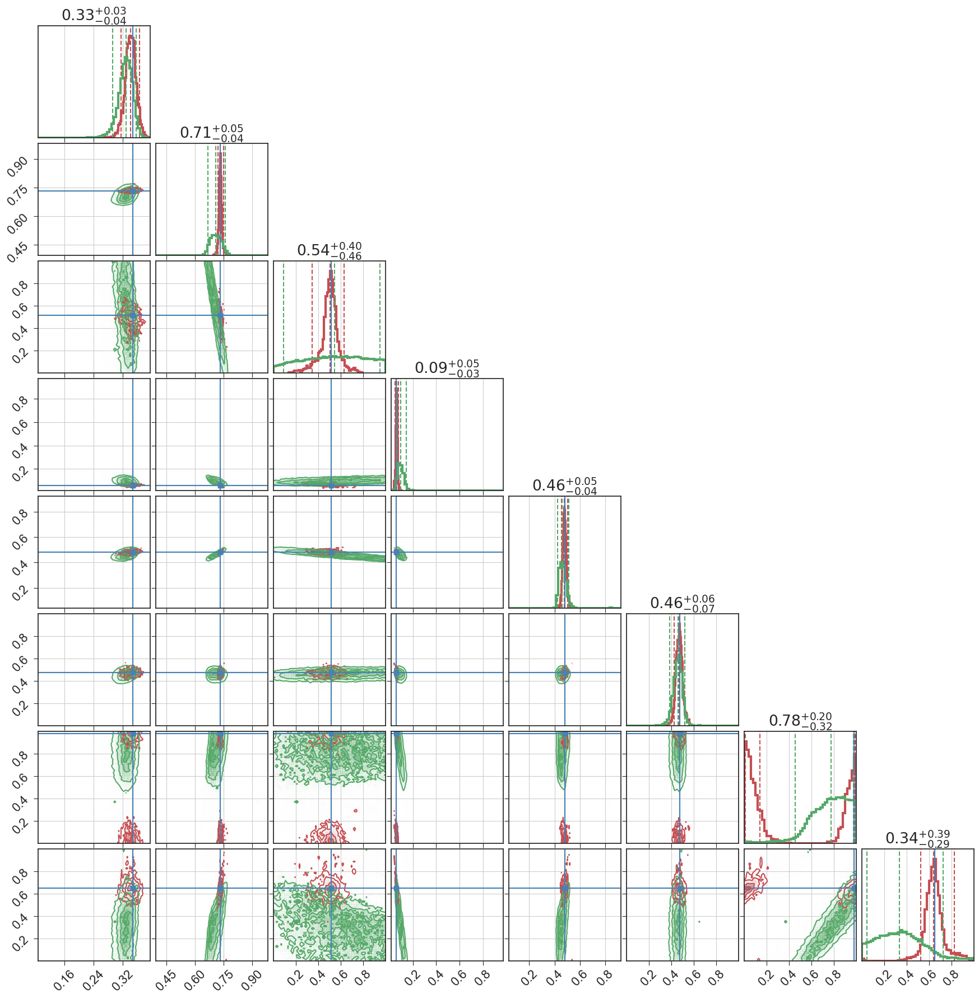

In [48]:
import matplotlib.lines as mlines

start = 5_000
fig300 = corner.corner(chain_acc[start:, :8], bins=50, hist_kwargs={'density':True, 'lw':3}, 
                    plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
                    show_titles=True, color='C2', use_math_test=True, truths=_srcHC245[:8]) 

corner.corner(ery_samples[:, :8], fig=fig300,bins=50, hist_kwargs={'density':True, 'lw':3},
              plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
              show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[:8])

line1 = mlines.Line2D([], [], color='C1', label='eryn')
line2 = mlines.Line2D([], [], color='C2', label='my')

# Add the legend to the figure
fig300.legend(handles=[line1, line2], loc='upper right', fontsize=20)


fig310 = corner.corner(chain_acc[start:, 8:16], bins=50, hist_kwargs={'density':True, 'lw':3}, 
                    plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
                    show_titles=True, color='C2', use_math_test=True, truths=_srcHC245[8:16]  ) 


corner.corner(ery_samples[:, 8:16], fig=fig310, bins=50, hist_kwargs={'density':True, 'lw':3},
              plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
              show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[8:16])

fig320 = corner.corner(chain_acc[start:, 16:24], bins=50, hist_kwargs={'density':True, 'lw':3}, 
                    plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
                    show_titles=True, color='C2', use_math_test=True, truths=_srcHC245[16:24]) 

corner.corner(ery_samples[:, 16:24], fig=fig320, bins=50, hist_kwargs={'density':True, 'lw':3},
              plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
              show_titles=True, color='C1', use_math_test=True, truths=_srcHC245[16:24])

 
plt.show()

In [49]:
def autocorr_1d(x, max_lag=None):
    """
    Compute autocorrelation function of a 1D series using FFT.
    Returns acf[0..max_lag].
    """
    x = np.asarray(x)
    x = x - np.mean(x)
    n = len(x)
    if max_lag is None:
        max_lag = n - 1

    # FFT-based autocorrelation
    f = np.fft.fft(x, n=2*n)
    acf = np.fft.ifft(f * np.conjugate(f))[:n].real
    acf /= acf[0]  # normalize
    return acf[:max_lag+1]

def integrated_autocorr_time(x, max_lag=None, c=5.0):
    """
    Compute the integrated autocorrelation time (IAT) for a 1D series.
    Parameters:
      x        : array (n,)
      max_lag  : maximum lag to consider
      c        : cutoff factor, stop summing when lag > c * tau
    Returns:
      tau_int  : integrated autocorrelation time
    """
    acf = autocorr_1d(x, max_lag)
    tau = 1.0
    for t in range(1, len(acf)):
        if acf[t] <= 0:   # conservative cutoff
            break
        tau += 2.0 * acf[t]
        if t > c * tau:   # automatic windowing
            break
    return tau



for ii in range (dim):
    acf =  integrated_autocorr_time(chain_acc[start:, ii])
    print (ii, acf)

0 7.543261588165999
1 3.5599278938131413
2 15.929661379297265
3 3.7491386466640204
4 5.547403775966807
5 22.334918796897774
6 1.0
7 191.39750132491864
8 72.7940786880741
9 592.9545017062123
10 420.1912572960763
11 17.326331901829985
12 18.184485568977433
13 23.552440756131467
14 69.76475913681543
15 37.374841892839456
16 17.32839629885565
17 11.575090146814922
18 9.102293732654738
19 7.5430326898256865
20 4.199695724852784
21 3.588366082013894
22 6.727917427150557
23 71.99039152749995


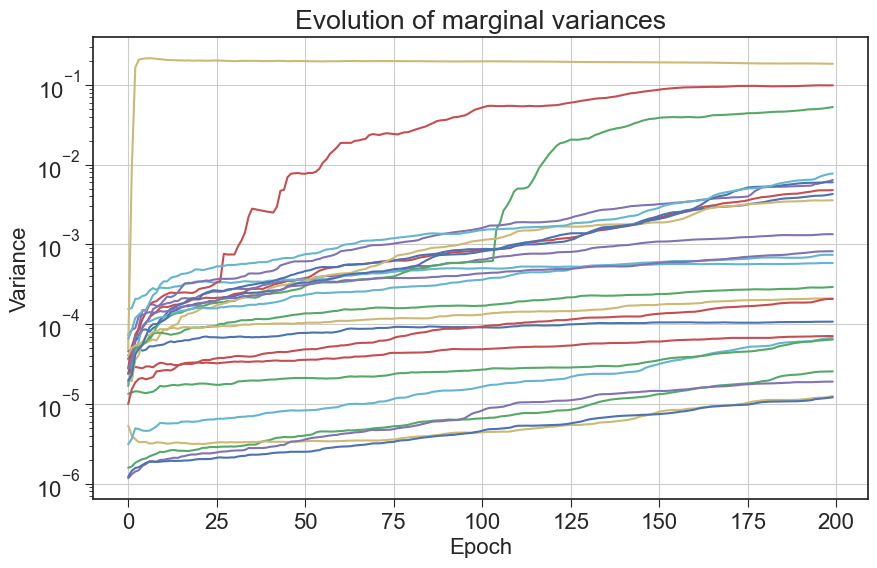

In [50]:
import seaborn as sns

print (covs_over_time[0].shape)

vars_evol = np.array([np.diag(C[chain_id, :, :]) for C in covs_over_time])  # (m_epochs, dim)



# for e, C in enumerate(covs_over_time[::max(1, len(covs_over_time)//10)]):  # sample ~10 epochs
#     print ('stas', C.shape)
#     corr = C[chain_id,:,:] / np.sqrt(np.outer(np.diag(C[chain_id,:,:]), np.diag(C[chain_id,:,:])))
#     plt.figure(figsize=(6,5))
#     sns.heatmap(corr, vmin=-1, vmax=1, cmap="coolwarm", cbar=True)
#     plt.title(f"Correlation matrix at epoch {e}")
#     plt.show()

from IPython.display import display, clear_output
import time
import matplotlib.gridspec as gridspec

# --- Animated Loop with fixed colorbar ---
# Create a figure with specific layout for heatmap and colorbar
fig = plt.figure(figsize=(7, 6))
gs = gridspec.GridSpec(1, 2, width_ratios=[20, 1], wspace=0.1)
ax = plt.subplot(gs[0])
cbar_ax = plt.subplot(gs[1])

# Loop through the covariance matrices
for e, C in enumerate(covs_over_time[::max(1, len(covs_over_time)//20)]):
# for e, C in enumerate(covs_over_time):
    # Clear the main plot area
    ax.clear()
    
    # Calculate the correlation matrix
    corr = C[chain_id,:,:] / np.sqrt(np.outer(np.diag(C[chain_id,:,:]), np.diag(C[chain_id,:,:])))
    
    # Draw the heatmap, telling it to use our dedicated axes for the plot and the colorbar
    # The colorbar is only drawn on the first iteration.
    is_first_iteration = (e == 0)
    sns.heatmap(corr, vmin=-1, vmax=1, cmap="coolwarm", 
                ax=ax, 
                cbar=is_first_iteration, 
                cbar_ax=cbar_ax if is_first_iteration else None)
    
    ax.set_title(f"Correlation matrix at epoch {e}")
    
    # Display the updated plot
    display(fig)
    
    # Clear the output for the next frame
    clear_output(wait=True)
    
    # Pause for 0.1 seconds
    time.sleep(1)

# Close the figure after the loop is done to prevent it from displaying twice
plt.close(fig)

plt.figure(figsize=(10,6))
for d in range(vars_evol.shape[1]):
    plt.semilogy(vars_evol[:, d], label=f"param {d}")
plt.xlabel("Epoch")
plt.ylabel("Variance")
# plt.legend()
plt.title("Evolution of marginal variances")
plt.show()

last_cov = covs_over_time[-1][chain_id, :, :]


In [28]:
print(last_cov)

[[ 1.07632011e-04  1.13522810e-05 -1.39073192e-05 -1.45497230e-04
   2.56748437e-06 -1.07371505e-04  1.52501283e-05 -1.65207230e-04
  -4.25116656e-06  3.02391887e-06 -9.71874893e-05 -4.53983419e-06
  -3.52600390e-06 -7.21100247e-06 -6.06148025e-05  1.04090473e-06
   4.95634104e-07 -3.93485734e-06 -2.05168705e-05  2.44274458e-06
  -8.65768910e-06 -6.79166356e-06  1.79733476e-04 -4.53395640e-05]
 [ 1.13522810e-05  2.56071173e-05 -2.23386184e-04 -9.98092108e-05
   1.29390572e-07 -2.95215192e-06  7.59389184e-05 -1.38795948e-04
  -4.18444840e-06  1.00606826e-06 -5.60431567e-06  7.71757197e-06
   1.88878442e-07 -5.91068172e-06 -2.25638857e-05 -1.26335445e-05
   1.59092583e-06  1.53875213e-06 -5.43753003e-05  1.97016196e-06
  -4.58719507e-06 -1.67527021e-06 -6.52747489e-05  9.30581904e-06]
 [-1.39073192e-05 -2.23386184e-04  4.80910798e-03  5.69567222e-04
   1.17668895e-04 -3.35590251e-05  9.84685319e-04 -1.99859170e-03
   2.13354961e-05 -2.87580728e-05 -4.97167141e-05 -4.93035672e-05
  -2.413

In [193]:
### Reading the trained model
import pickle


def _featurize_batch(X_raw, *, meta, T=None):
    """Same feature pipeline used at training: linear + sin/cos(periodic) + optional 1/T, then standardize."""
    X_raw = np.asarray(X_raw)
    D = meta["D_raw"]
    periodic_idx = np.asarray(meta["periodic_idx"])
    period = float(meta["period"])
    add_invT = bool(meta.get("add_invT", False))

    mask = np.ones(D, dtype=bool)
    if periodic_idx.size:
        mask[periodic_idx] = False

    X_lin = X_raw[:, mask]
    parts = [X_lin]

    if periodic_idx.size:
        Xp = X_raw[:, periodic_idx]
        parts += [np.sin(2*np.pi*Xp/period), np.cos(2*np.pi*Xp/period)]

    if add_invT:
        if T is None:
            raise ValueError("meta.add_invT=True but no T provided")
        parts.append((1.0/np.maximum(np.asarray(T), 1e-12))[:, None])

    X_feat = np.concatenate(parts, axis=1).astype(np.float32)
    Xn = (X_feat - np.asarray(meta["x_mean"])) / np.asarray(meta["x_std"])
    return Xn.astype(np.float32)

def load_surrogate(pkl_path):
    with open(pkl_path, "rb") as f:
        saved = pickle.load(f)
    params = saved["params"]
    meta   = saved["meta"]
    cfg    = meta["model_cfg"]

    # Recreate the model with the same architecture
    model = NN.LogProbNet(**cfg)

    # JITed batched apply
    @jax.jit
    def _apply_batched(x_batched):
        return model.apply({"params": params}, x_batched, train=False)

    def predict(theta, T=None, return_var=False):
        """
        theta: (D_raw,) or (N, D_raw) raw parameters (pre-feature)
        T    : scalar or (N,) if meta['add_invT'] is True; else ignored
        Returns unnormalized log-prob (de-standardized).
        If heteroscedastic=True, set return_var=True to also get variance.
        """
        single = (np.asarray(theta).ndim == 1)
        if single:
            Xn = _featurize_batch(np.asarray(theta)[None, :], meta=meta, T=T)
        else:
            if meta.get("add_invT", False):
                if T is None:
                    raise ValueError("meta.add_invT=True but T is None for batch.")
                if np.isscalar(T):
                    T = np.full((np.asarray(theta).shape[0],), T, dtype=np.float32)
                elif len(T) != np.asarray(theta).shape[0]:
                    raise ValueError("T must be scalar or shape (N,).")
            Xn = _featurize_batch(theta, meta=meta, T=T)

        out = _apply_batched(jnp.asarray(Xn))
        y_mean = float(meta["y_mean"]); y_std = float(meta["y_std"])

        if cfg.get("heteroscedastic", False):
            mu, logv = out
            mu = np.array(mu) * y_std + y_mean
            var = np.exp(np.array(logv)) * (y_std**2)
            if single:
                mu, var = mu[0], var[0]
            return (mu, var) if return_var else mu
        else:
            mu = np.array(out) * y_std + y_mean
            if single: mu = mu[0]
            return mu

    return predict, meta, params

In [194]:
# Load the trained surrogate
predict, meta, params = load_surrogate("trained_loglik_modelv3.pkl")

In [195]:

print (GB3_loglik(_srcHC245), predict(_srcHC245))

print (ery_samples[:, :].shape)

-188.01290930804637 -185.43684
(72000, 24)


In [196]:
from tqdm import tqdm

true_ll = []
pred_ll = []
for ii, p in tqdm(enumerate(ery_samples[:, :])):
    true_ll.append(GB3_loglik(p))
    pred_ll.append(predict(p))

true_ll = np.array(true_ll)
pred_ll = np.array(pred_ll) 

72000it [01:05, 1096.72it/s]


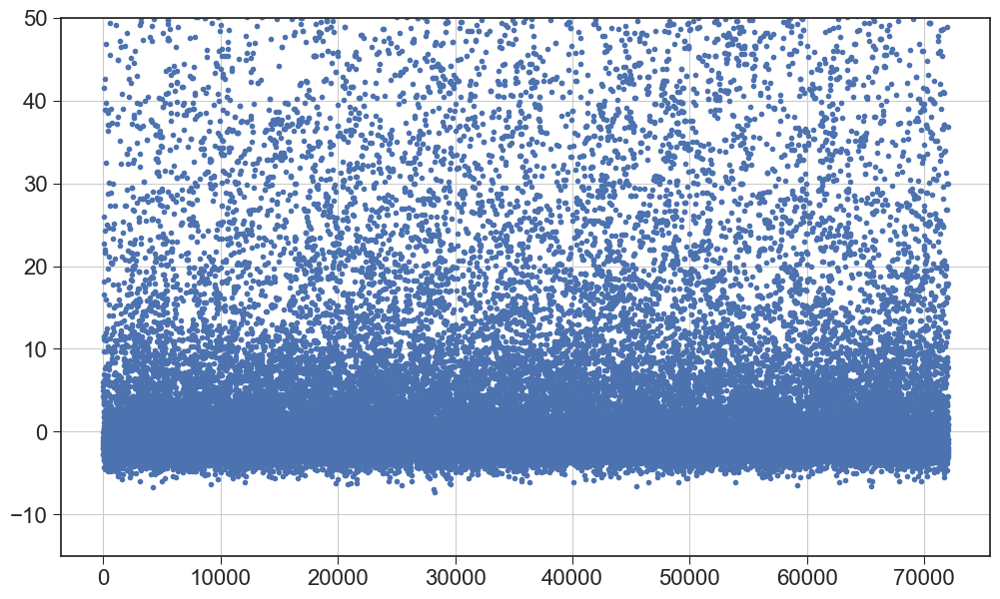

(50247, 1) (55626, 1) (40486, 1)


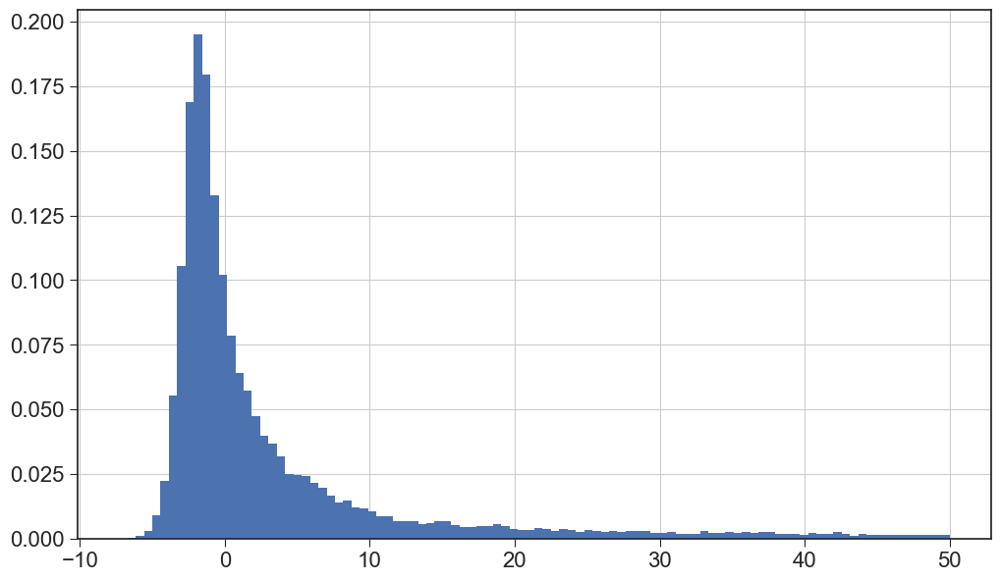

In [174]:
plt.plot(true_ll - pred_ll, '.')
plt.ylim(-15, 50)
plt.show()

diff_ll = true_ll - pred_ll

print (np.argwhere(diff_ll < 10).shape, np.argwhere(diff_ll < 30).shape, np.argwhere(diff_ll > 0).shape)

plt.hist(diff_ll[np.argwhere(diff_ll < 50)], bins=100, density=True)
plt.show()

In [175]:
print (chain_acc.shape, true_ll.shape, pred_ll.shape)

(56938, 24) (72000,) (72000,)


In [176]:
true_ll = []
pred_ll = []

for ii, p in tqdm(enumerate(chain_acc)):
    true_ll.append(GB3_loglik(p))
    pred_ll.append(predict(p))

true_ll = np.array(true_ll)
pred_ll = np.array(pred_ll) 



56938it [00:50, 1116.72it/s]


1.1368683772161603e-13


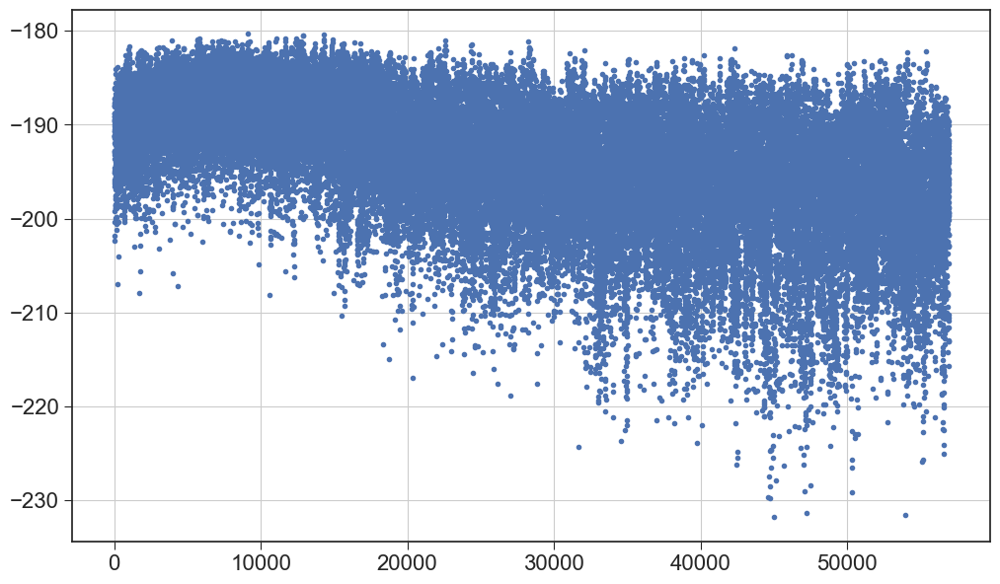

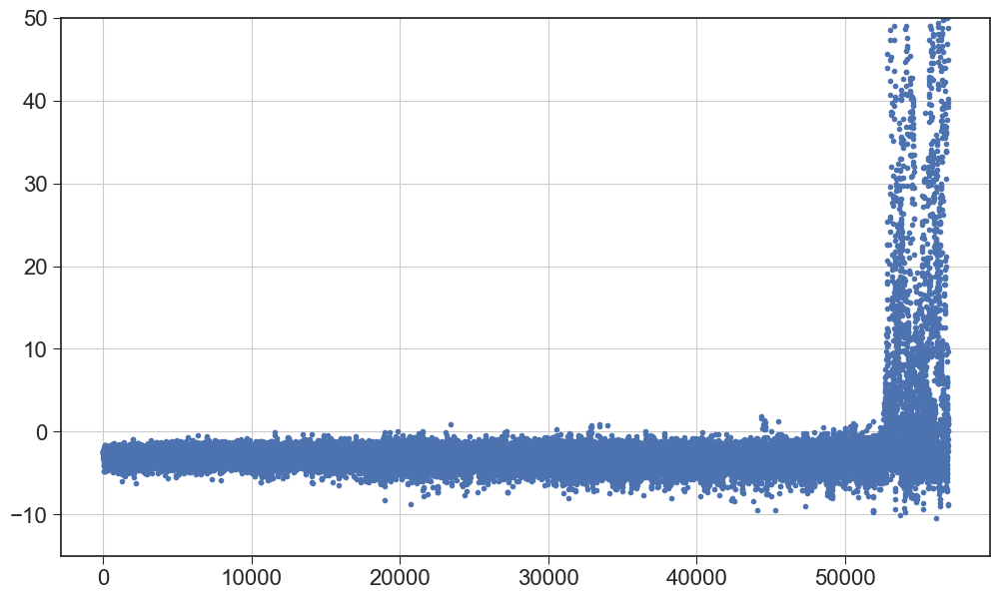

(55660, 1) (56269, 1) (2285, 1)


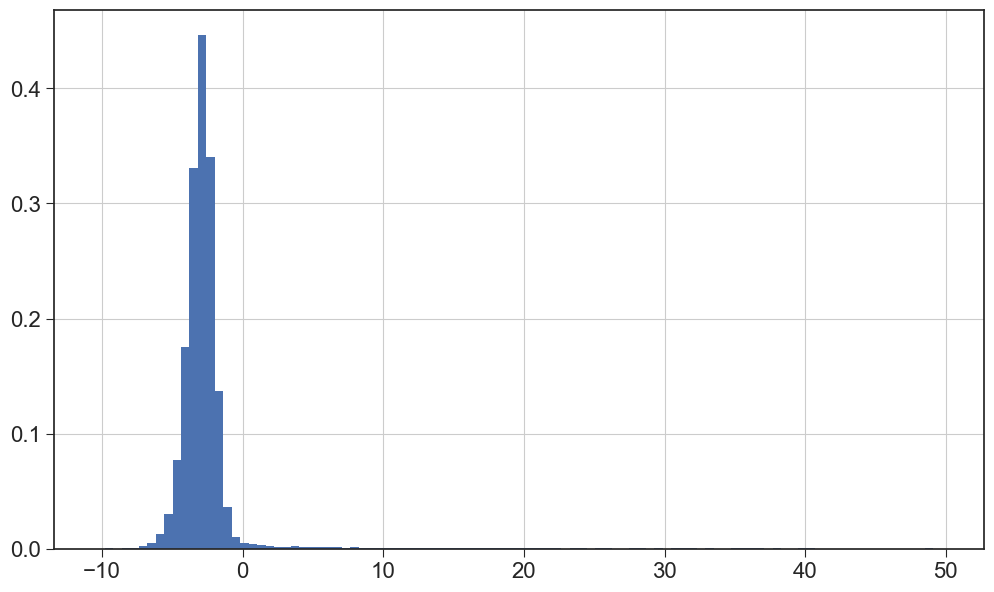

In [177]:
print ( np.max(true_ll-ll_acc ) )

plt.plot(true_ll, '.')
plt.show()


plt.plot(true_ll - pred_ll, '.')
plt.ylim(-15, 50)
plt.show()

diff_ll = true_ll - pred_ll

print (np.argwhere(diff_ll < 10).shape, np.argwhere(diff_ll < 30).shape, np.argwhere(diff_ll > 0).shape)

plt.hist(diff_ll[np.argwhere(diff_ll < 50)], bins=100, density=True)
plt.show()

In [178]:
nan_indices_y = np.where(np.isnan(true_ll))
if nan_indices_y[0].size > 0:
    print("\nIndices of NaNs in y:")
    print(nan_indices_y[0].size)
else:
    print("\nNo NaN values found in y.")


No NaN values found in y.


In [15]:
from tqdm import trange